<a href="https://colab.research.google.com/github/frnocentini/brain-tumor-object-dectection/blob/main/Brain_tumor_effnet_no_crop_no_duplication.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [10]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [11]:
%cd '/content/drive/MyDrive/dataset brain tumor/dataset'


/content/drive/MyDrive/dataset brain tumor/dataset


In [12]:
!unzip 'axial_t1wce_2_class' -d '/dataset unzipped'

Archive:  axial_t1wce_2_class.zip
  inflating: /dataset unzipped/axial_t1wce_2_class/axial_t1wce_2_class.yaml  
   creating: /dataset unzipped/axial_t1wce_2_class/images/
   creating: /dataset unzipped/axial_t1wce_2_class/images/test/
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_101.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_109.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_111.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_117.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_121.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_126.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_134.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00019_66.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00019_75.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/image

In [13]:
!unzip 'coronal_t1wce_2_class' -d '/dataset unzipped'

Archive:  coronal_t1wce_2_class.zip
  inflating: /dataset unzipped/coronal_t1wce_2_class/coronal_t1wce_2_class.yaml  
   creating: /dataset unzipped/coronal_t1wce_2_class/images/
   creating: /dataset unzipped/coronal_t1wce_2_class/images/test/
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/13.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/15.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/17.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/19.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/20.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/23.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/33.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/34.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/35.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/36.jpg  
  inflating: /d

In [14]:
!unzip 'sagittal_t1wce_2_class' -d '/dataset unzipped'

Archive:  sagittal_t1wce_2_class.zip
   creating: /dataset unzipped/sagittal_t1wce_2_class/images/
   creating: /dataset unzipped/sagittal_t1wce_2_class/images/test/
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00000_102.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00000_121.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00000_140.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00000_159.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00002_110.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00002_129.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00002_147.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00002_166.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00003_154.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00003_173.jpg  
  inflating: /

In [15]:
# Data Manipulation
import numpy as np
import pandas as pd
import os
# Visualization/Image Processing
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
# Machine Learning
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, Input, BatchNormalization, Flatten, MaxPool2D, Dense, Activation
from PIL import Image
# Other
from pathlib import Path
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.models import Model
import xml.etree.ElementTree as ET
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers

In [16]:
#Codice per rendere l'immagine quadrata 
def make_square(im, fill_color=(0, 0, 0, 0)):
    x, y = im.shape[0], im.shape[1]
    size = max(x, y)
    BLACK = [0, 0, 0]
    new_im = cv2.copyMakeBorder(im,int((size-y)/2),int((size-y)/2),int((size-x)/2),int((size-x)/2),cv2.BORDER_CONSTANT, value = BLACK)
    return new_im

In [17]:
%cd '/dataset unzipped'


/dataset unzipped


In [18]:
#Bounding box with one tumor
lab = ['axial_t1wce_2_class','coronal_t1wce_2_class', 'sagittal_t1wce_2_class']
X_train = []
bb = []
temp_array  = []
image_size = 180
for i in lab:
    folderPath = os.path.join('./',i,'images','train')
    for j in sorted(os.listdir(folderPath)):
        img = cv2.imread(os.path.join(folderPath,j))
        print(os.path.join(folderPath,j))
        if img.shape[0] != img.shape[1]:
            img = make_square(img, fill_color=(0, 0, 0, 0))
        img = cv2.resize(img,(image_size, image_size))
        X_train.append(img)
image_index = 0
bb_train = np.zeros((len(X_train),4))
for i in lab:
    labelsPath = os.path.join('./',i,'labels','train')
    for j in sorted(os.listdir(labelsPath)):
        print(os.path.join(labelsPath,j))
        with open(os.path.join(labelsPath,j), encoding="utf-8") as f:
            for line in f:
                num = list(map(float,line.split(" ")))
                temp_array = []
                for k in num:
                    k = k * image_size
                    temp_array.append(k)
                temp_array.pop(0)
                #print(temp_array)
                bb_train[image_index] = np.array([temp_array])
                #print(bb_train[image_index])
            image_index += 1

X_test = []
for i in lab:
    folderPath = os.path.join('./',i,'images','test')
    for j in sorted(os.listdir(folderPath)):
        img = cv2.imread(os.path.join(folderPath,j))
        if img.shape[0] != img.shape[1]:
            img = make_square(img, fill_color=(0, 0, 0, 0))
        img = cv2.resize(img,(image_size, image_size))
        X_test.append(img)
image_index = 0
bb_test = np.zeros((len(X_test),4))
for i in lab:
    labelsPath = os.path.join('./',i,'labels','test')
    for j in sorted(os.listdir(labelsPath)):
        with open(os.path.join(labelsPath,j), encoding="utf-8") as f:
            for line in f:
                num = list(map(float,line.split(" ")))
                temp_array = []
                for k in num:
                    #print(k)
                    k = k * image_size
                    temp_array.append(k)
                temp_array.pop(0)
                #print(temp_array)
                bb_test[image_index] = np.array([temp_array])
                #print(bb_test[image_index])
            image_index += 1
#print(bb_test.shape[0])

./axial_t1wce_2_class/images/train/00095_170.jpg
./axial_t1wce_2_class/images/train/00095_176.jpg
./axial_t1wce_2_class/images/train/00095_188.jpg
./axial_t1wce_2_class/images/train/00095_200.jpg
./axial_t1wce_2_class/images/train/00095_212.jpg
./axial_t1wce_2_class/images/train/00095_224.jpg
./axial_t1wce_2_class/images/train/00095_226.jpg
./axial_t1wce_2_class/images/train/00095_236.jpg
./axial_t1wce_2_class/images/train/00097_65.jpg
./axial_t1wce_2_class/images/train/00097_68.jpg
./axial_t1wce_2_class/images/train/00097_70.jpg
./axial_t1wce_2_class/images/train/00097_72.jpg
./axial_t1wce_2_class/images/train/00097_74.jpg
./axial_t1wce_2_class/images/train/00097_76.jpg
./axial_t1wce_2_class/images/train/00097_77.jpg
./axial_t1wce_2_class/images/train/00097_79.jpg
./axial_t1wce_2_class/images/train/00097_80.jpg
./axial_t1wce_2_class/images/train/00097_81.jpg
./axial_t1wce_2_class/images/train/00097_83.jpg
./axial_t1wce_2_class/images/train/00099_129.jpg
./axial_t1wce_2_class/images/tr

In [19]:
len(X_train)

878

In [38]:
#prepare dataset 
train_dataset = ImageDataGenerator()
val_dataset = ImageDataGenerator()
test_dataset = ImageDataGenerator()

In [21]:
#array conversion
X_train = np.array(X_train)
X_test = np.array(X_test)

In [22]:
#Shuffle
X_train, bb_train = shuffle(X_train, bb_train)

In [23]:
#Validation set created
X_train, X_val, bb_train, bb_val = train_test_split(X_train, bb_train, test_size = 0.1, shuffle = False)

In [41]:
BATCH_SIZE = 16
#save_path = os.path.join('./', 'model_effnet')
train_dataset = train_dataset.flow(X_train, bb_train, batch_size = BATCH_SIZE)
val_dataset = val_dataset.flow(X_val, bb_val, batch_size = BATCH_SIZE)


In [39]:
test_dataset = test_dataset.flow(X_test, bb_test, batch_size = BATCH_SIZE)

In [ ]:
#Function to define the IoU metrics
def raw_iou(y_true, y_pred):
    results = []
    for i in range(0,y_true.shape[0]):

        #define the true and predicted coordinates (height and width)
        boxTrue_width = y_true[i,2]
        boxTrue_height = y_true[i,3]
        x_boxTrue_tleft = y_true[i,0]-boxTrue_width/2 
        y_boxTrue_tleft = y_true[i,1]-boxTrue_height/2

        #Define the bb true area 
        area_boxTrue = (boxTrue_width * boxTrue_height)

        # boxPred
        boxPred_width = y_pred[i,2]
        boxPred_height = y_pred[i,3]
        x_boxPred_tleft = y_pred[i,0]-boxPred_width/2  
        y_boxPred_tleft = y_pred[i,1]-boxPred_height/2

        #Define the bb predicted area 
        area_boxPred = (boxPred_width * boxPred_height)


        # calculate the bottom right coordinates for boxTrue and boxPred

        # boxTrue
        x_boxTrue_br = x_boxTrue_tleft + boxTrue_width
        y_boxTrue_br = y_boxTrue_tleft + boxTrue_height # Version 2 revision

        # boxPred
        x_boxPred_br = x_boxPred_tleft + boxPred_width
        y_boxPred_br = y_boxPred_tleft + boxPred_height # Version 2 revision


        # calculate the top left and bottom right coordinates for the intersection box, boxInt

        # boxIntersection - top left coords
        x_boxInt_tleft = np.max([x_boxTrue_tleft,x_boxPred_tleft])
        y_boxInt_tleft = np.max([y_boxTrue_tleft,y_boxPred_tleft]) # Version 2 revision

        # boxIntersection - bottom right coords
        x_boxInt_br = np.min([x_boxTrue_br,x_boxPred_br])
        y_boxInt_br = np.min([y_boxTrue_br,y_boxPred_br]) 

        # Calculate the area of boxInt, i.e. the area of the intersection 
        # between boxTrue and boxPred.
        # The np.max() function forces the intersection area to 0 if the boxes don't overlap.
        
        area_of_intersection = \
        np.max([0,(x_boxInt_br - x_boxInt_tleft)]) * np.max([0,(y_boxInt_br - y_boxInt_tleft)])
        
        #calculate the mean IoU for every image
        iou = np.mean(area_of_intersection / ((area_boxTrue + area_boxPred) - area_of_intersection)).astype(np.float32)

        results.append(iou)
    return np.mean(results)

# metric creation
def IoU(y_true, y_pred):
    iou = tf.numpy_function(raw_iou, [y_true, y_pred], tf.float32)
    return iou


In [28]:
# Draw the predicted bounding boxes
def display_image(img, bbox_coords, pred_coords):
    if len(bbox_coords) == 4: #in rosso
        xmin, ymin, height, width = bbox_coords
        img = cv2.rectangle(img, (int(xmin-height/2), int(ymin-width/2)), (int(xmin+height/2), int(ymin+width/2)), (255, 0, 0), 1)
        #img = cv2.rectangle(img, (0,0),(10,10), (0, 0, 255), 1)
    if len(pred_coords) == 4: #in verde
        xmin1, ymin1, height1, width1 = pred_coords
        img = cv2.rectangle(img, (int(xmin1-height1/2), int(ymin1-width1/2)), (int(xmin1+height1/2), int(ymin1+width1/2)), (0, 255, 0), 1)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])

In [29]:
#To test the model
def test_model(model):
    rand_index = np.random.randint(0, bb_test.shape[0])
    pred_bbox = model.predict(X_test)[rand_index]
    img_original = X_test[rand_index]
    img = img_original.copy()
    coords = bb_test[rand_index]    
    display_image(img,bbox_coords = coords, pred_coords=pred_bbox)

def test(model):
    
    plt.figure(figsize=(15,7))
    for i in range(3):
        plt.subplot(1, 3, i + 1)
        test_model(model)    
    plt.show()

class ShowTestImages(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        test(self.model)
        

In [31]:
#list of callbacks
callbacks_list = [
    tf.keras.callbacks.EarlyStopping(
    monitor="val_IoU",
    min_delta=0,
    patience=20,
    verbose=0,
    mode="max",
    baseline=None,
    restore_best_weights=True,
    start_from_epoch=100),
    ShowTestImages()
]

In [32]:
effnet = EfficientNetB0(weights='imagenet',include_top=False,input_shape=(image_size,image_size,3))
model = effnet.output
model = tf.keras.layers.GlobalAveragePooling2D()(model)
model = tf.keras.layers.Dropout(rate=0.5)(model)
model = tf.keras.layers.Flatten()(model)
model = tf.keras.layers.Dense(4,name='bb_pred')(model)
model = tf.keras.models.Model(inputs=effnet.inputs, outputs = model)
model.summary

16705208/16705208 [==============================] - 0s 0us/step


<bound method Model.summary of <keras.engine.functional.Functional object at 0x7fbca445dde0>>

In [33]:
model.compile(
    loss={
        'bb_pred': 'mae'
    },
    optimizer=tf.keras.optimizers.Adam(1e-3),
    metrics=[IoU]
    
)

Epoch 1/150
7/7 [==============================] - 0s 36ms/step


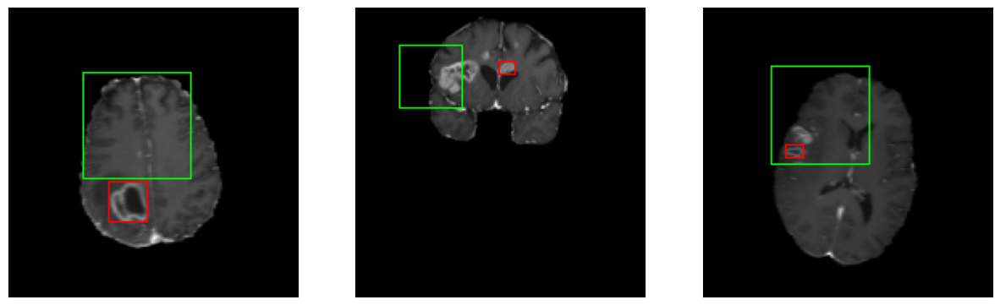

50/50 [==============================] - 71s 295ms/step - loss: 41.6028 - IoU: 0.0000e+00 - val_loss: 30.9644 - val_IoU: 0.0785
Epoch 2/150
7/7 [==============================] - 0s 37ms/step


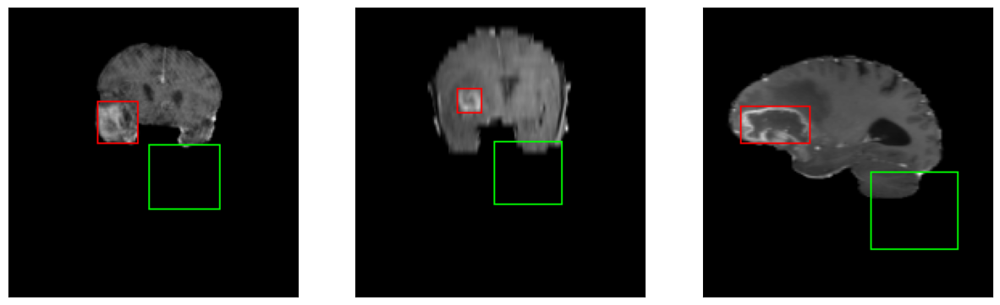

50/50 [==============================] - 7s 136ms/step - loss: 24.8427 - IoU: 0.0122 - val_loss: 28.2390 - val_IoU: 0.0252
Epoch 3/150
7/7 [==============================] - 0s 35ms/step


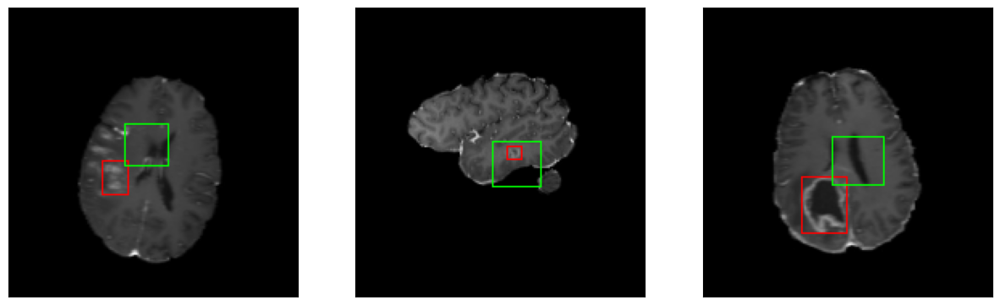

50/50 [==============================] - 6s 129ms/step - loss: 14.8814 - IoU: 0.0718 - val_loss: 16.7486 - val_IoU: 0.0393
Epoch 4/150
7/7 [==============================] - 0s 36ms/step


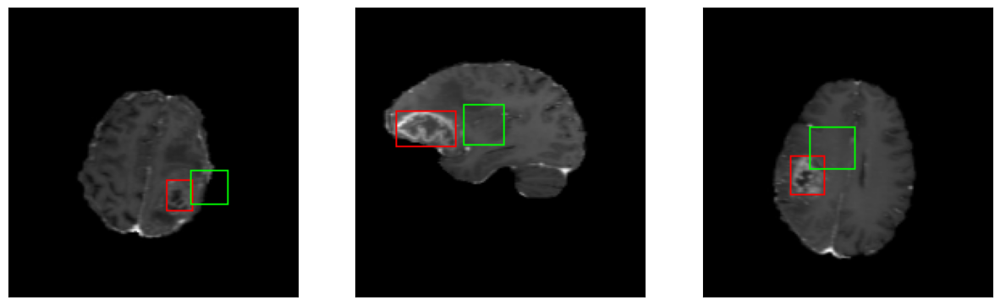

50/50 [==============================] - 7s 137ms/step - loss: 10.7075 - IoU: 0.1424 - val_loss: 12.4821 - val_IoU: 0.0878
Epoch 5/150
7/7 [==============================] - 0s 39ms/step


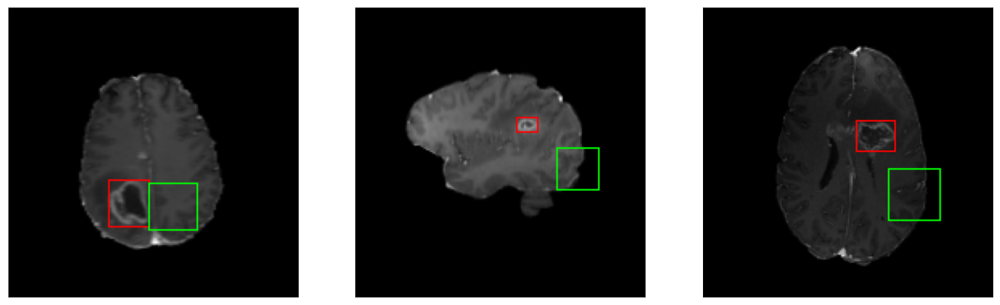

50/50 [==============================] - 7s 139ms/step - loss: 8.1341 - IoU: 0.2084 - val_loss: 17.5948 - val_IoU: 0.0125
Epoch 6/150
7/7 [==============================] - 0s 36ms/step


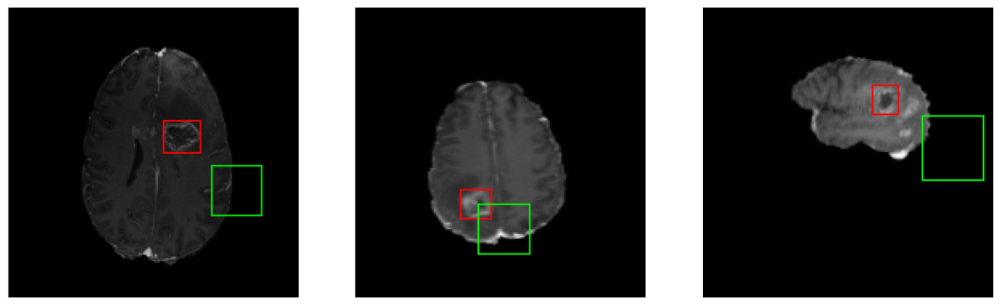

50/50 [==============================] - 6s 129ms/step - loss: 6.9411 - IoU: 0.2515 - val_loss: 20.7988 - val_IoU: 0.0117
Epoch 7/150
7/7 [==============================] - 0s 37ms/step


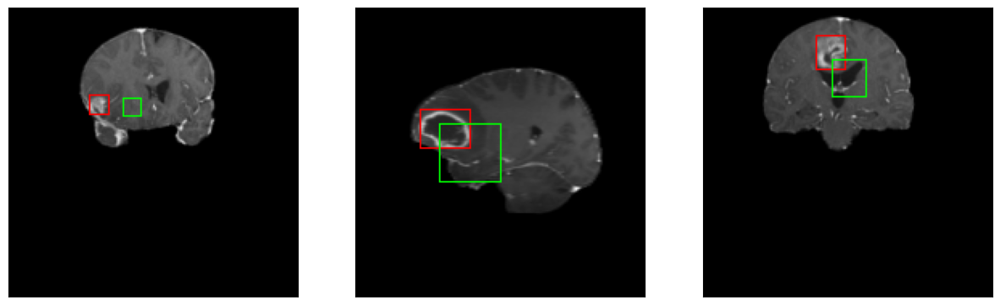

50/50 [==============================] - 7s 138ms/step - loss: 6.3450 - IoU: 0.2783 - val_loss: 14.7995 - val_IoU: 0.0641
Epoch 8/150
7/7 [==============================] - 0s 36ms/step


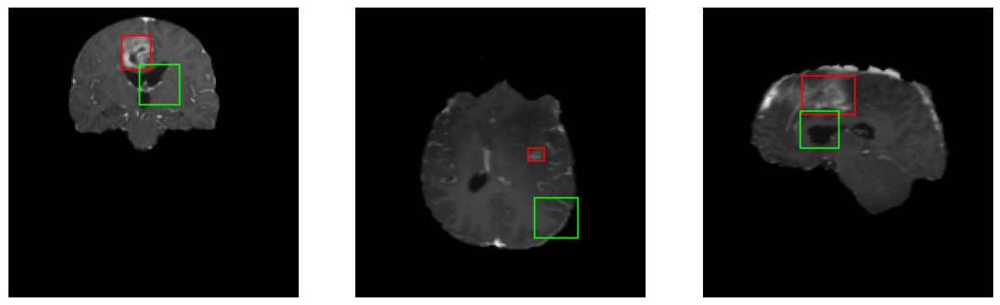

50/50 [==============================] - 7s 139ms/step - loss: 6.1821 - IoU: 0.2680 - val_loss: 15.7935 - val_IoU: 0.0559
Epoch 9/150
7/7 [==============================] - 0s 36ms/step


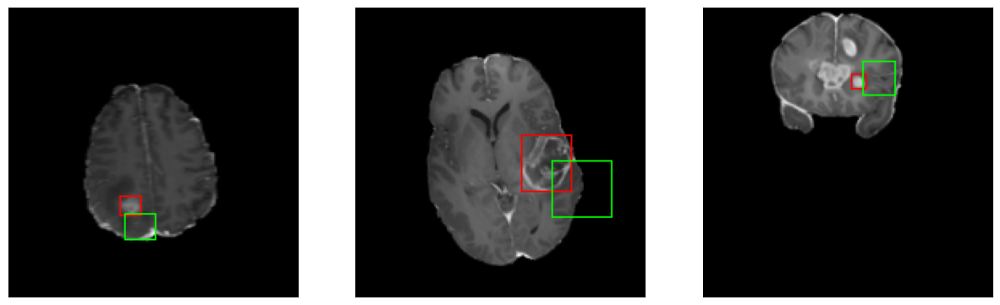

50/50 [==============================] - 7s 133ms/step - loss: 5.5105 - IoU: 0.3111 - val_loss: 10.9888 - val_IoU: 0.0886
Epoch 10/150
7/7 [==============================] - 0s 38ms/step


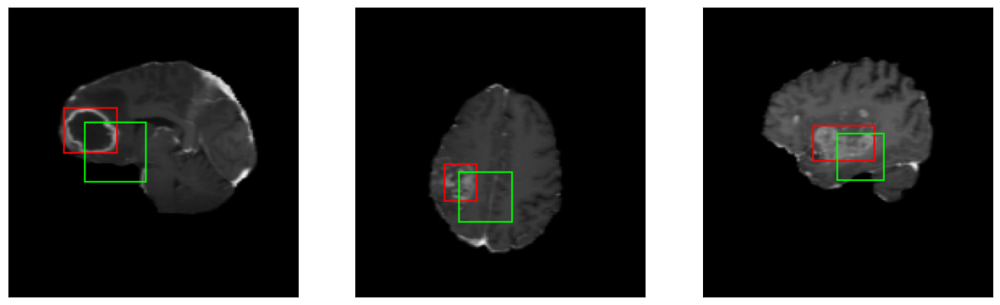

50/50 [==============================] - 7s 140ms/step - loss: 5.3814 - IoU: 0.3257 - val_loss: 11.7990 - val_IoU: 0.1172
Epoch 11/150
7/7 [==============================] - 0s 37ms/step


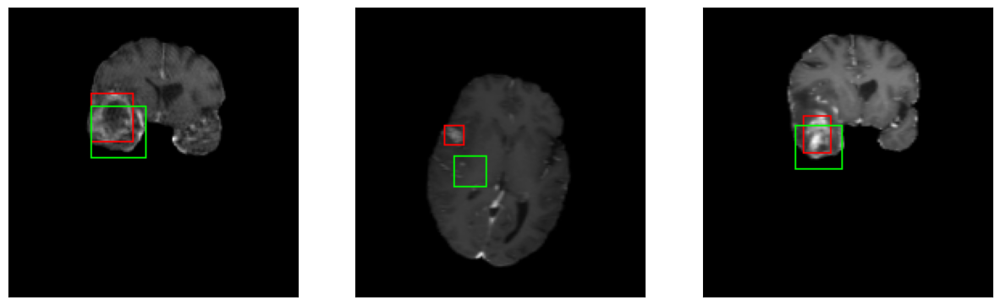

50/50 [==============================] - 7s 132ms/step - loss: 5.2851 - IoU: 0.3320 - val_loss: 5.5630 - val_IoU: 0.3573
Epoch 12/150
7/7 [==============================] - 0s 37ms/step


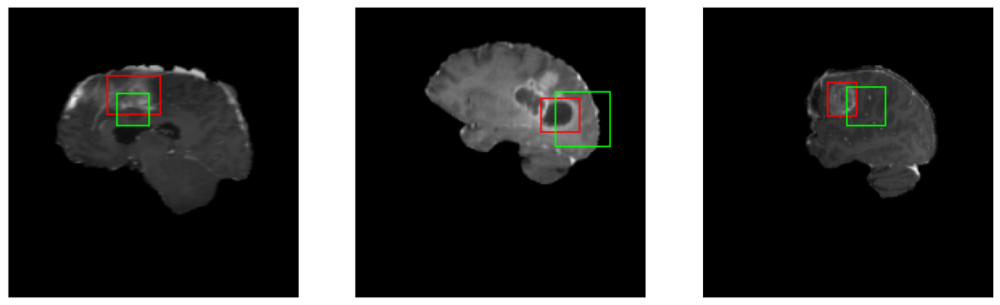

50/50 [==============================] - 7s 139ms/step - loss: 5.2782 - IoU: 0.3161 - val_loss: 9.4988 - val_IoU: 0.1338
Epoch 13/150
7/7 [==============================] - 0s 39ms/step


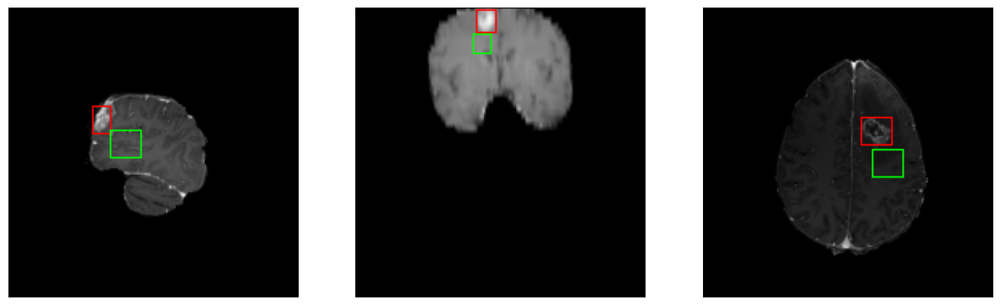

50/50 [==============================] - 7s 143ms/step - loss: 4.8582 - IoU: 0.3525 - val_loss: 8.0306 - val_IoU: 0.1866
Epoch 14/150
7/7 [==============================] - 0s 37ms/step


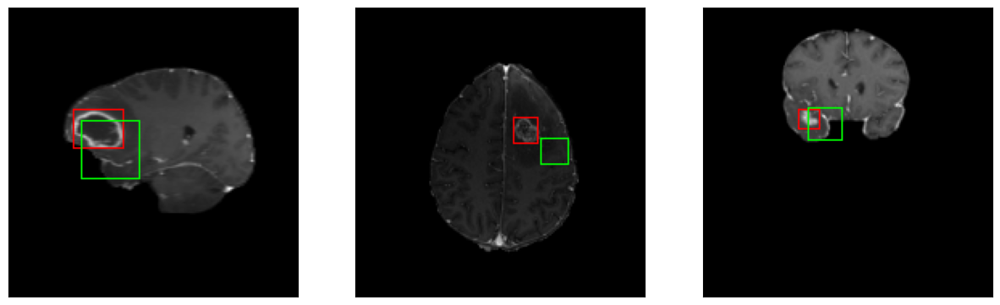

50/50 [==============================] - 7s 134ms/step - loss: 4.6240 - IoU: 0.3725 - val_loss: 9.2684 - val_IoU: 0.1841
Epoch 15/150
7/7 [==============================] - 0s 41ms/step


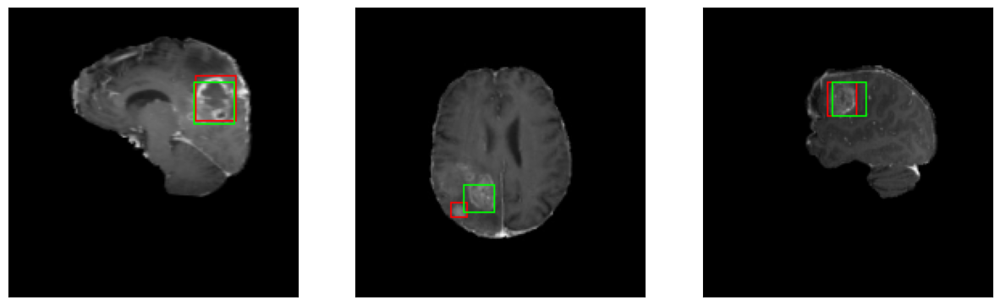

50/50 [==============================] - 7s 141ms/step - loss: 4.4925 - IoU: 0.3768 - val_loss: 4.3288 - val_IoU: 0.4949
Epoch 16/150
7/7 [==============================] - 0s 37ms/step


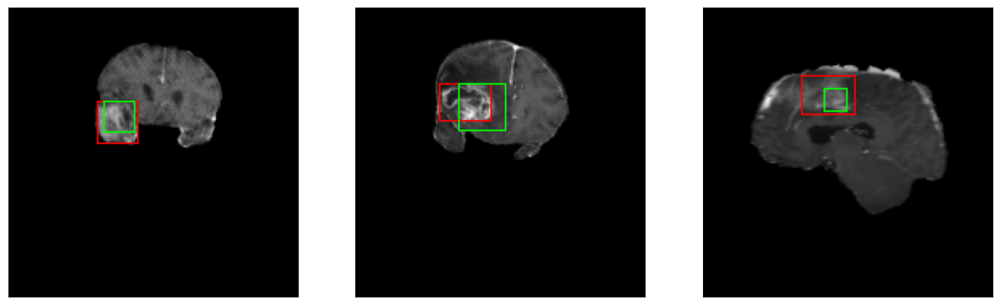

50/50 [==============================] - 7s 133ms/step - loss: 4.5663 - IoU: 0.3803 - val_loss: 6.0141 - val_IoU: 0.3601
Epoch 17/150
7/7 [==============================] - 0s 37ms/step


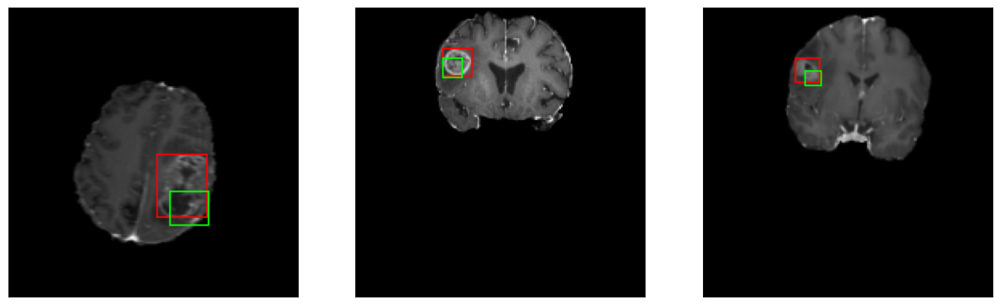

50/50 [==============================] - 7s 142ms/step - loss: 4.5282 - IoU: 0.3707 - val_loss: 5.1352 - val_IoU: 0.3994
Epoch 18/150
7/7 [==============================] - 0s 37ms/step


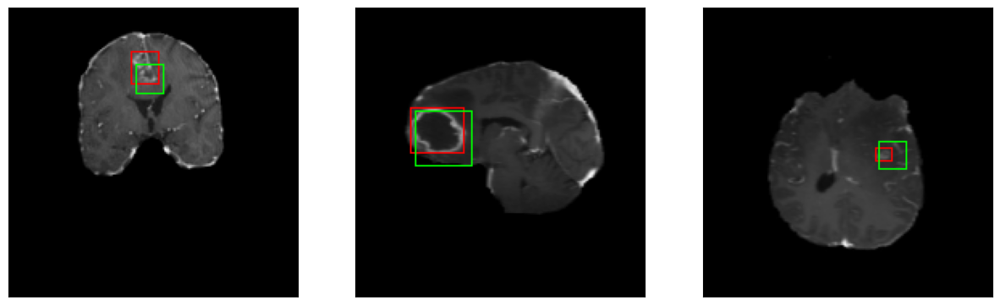

50/50 [==============================] - 7s 132ms/step - loss: 4.3637 - IoU: 0.3984 - val_loss: 5.0060 - val_IoU: 0.4526
Epoch 19/150
7/7 [==============================] - 0s 37ms/step


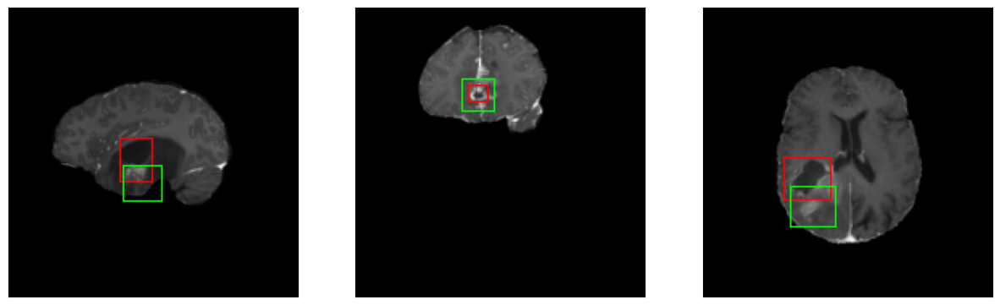

50/50 [==============================] - 7s 142ms/step - loss: 4.1270 - IoU: 0.4224 - val_loss: 4.6180 - val_IoU: 0.4798
Epoch 20/150
7/7 [==============================] - 0s 37ms/step


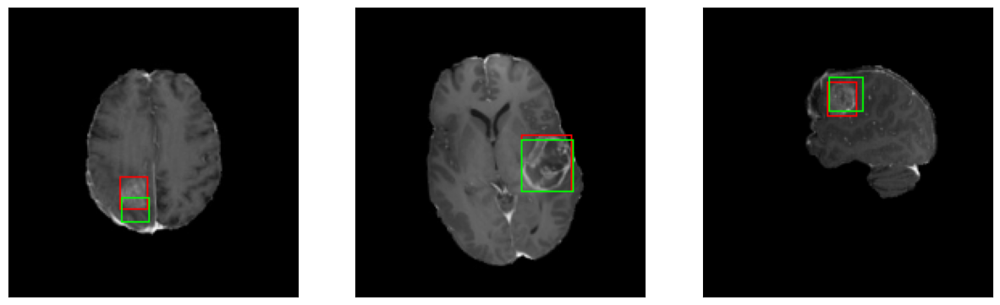

50/50 [==============================] - 7s 133ms/step - loss: 4.3236 - IoU: 0.3986 - val_loss: 3.9500 - val_IoU: 0.5416
Epoch 21/150
7/7 [==============================] - 0s 37ms/step


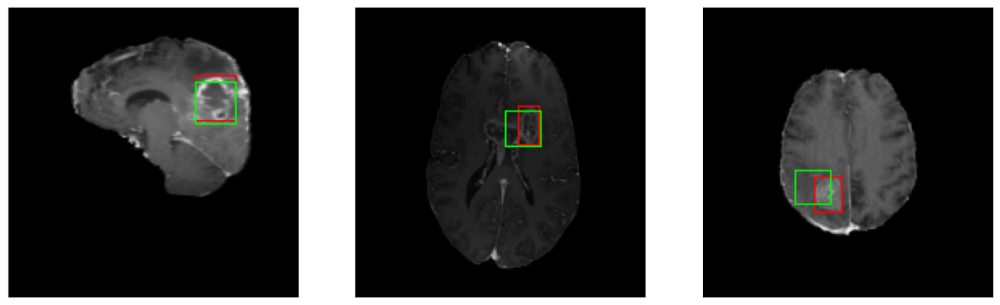

50/50 [==============================] - 7s 136ms/step - loss: 4.3222 - IoU: 0.3983 - val_loss: 4.5835 - val_IoU: 0.4566
Epoch 22/150
7/7 [==============================] - 0s 39ms/step


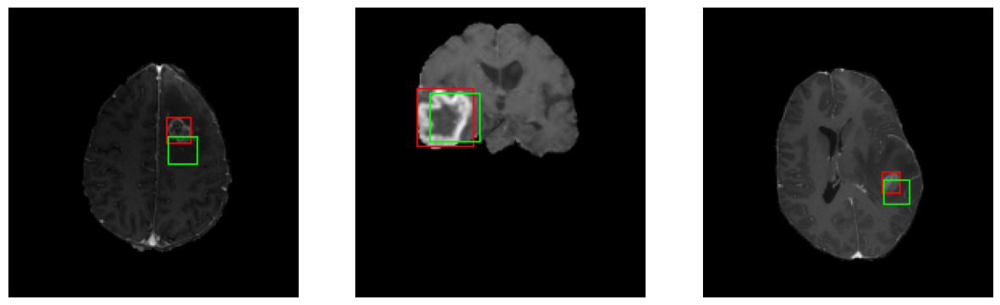

50/50 [==============================] - 7s 143ms/step - loss: 4.2722 - IoU: 0.4069 - val_loss: 4.8193 - val_IoU: 0.4354
Epoch 23/150
7/7 [==============================] - 0s 37ms/step


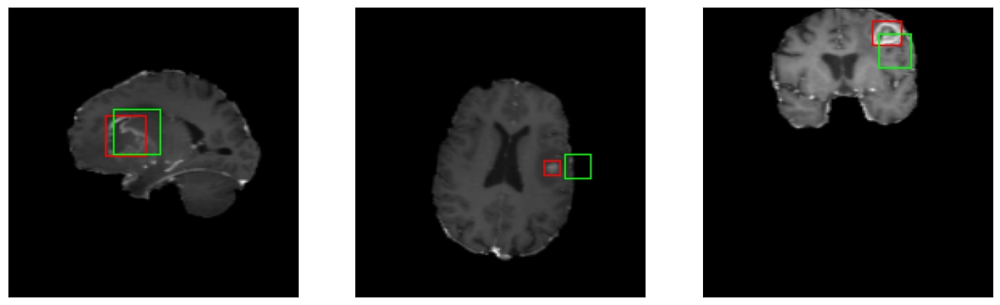

50/50 [==============================] - 7s 135ms/step - loss: 4.1607 - IoU: 0.4106 - val_loss: 6.1880 - val_IoU: 0.3068
Epoch 24/150
7/7 [==============================] - 0s 39ms/step


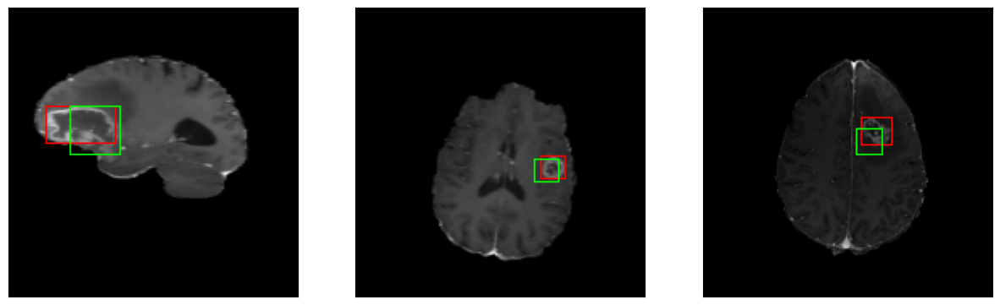

50/50 [==============================] - 8s 157ms/step - loss: 3.9747 - IoU: 0.4284 - val_loss: 4.3080 - val_IoU: 0.5067
Epoch 25/150
7/7 [==============================] - 0s 37ms/step


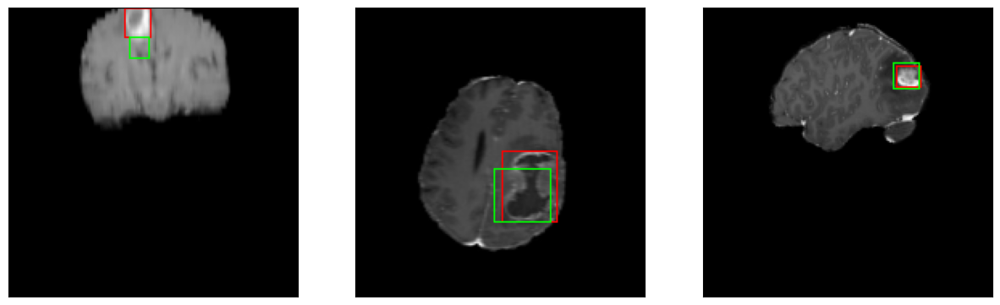

50/50 [==============================] - 7s 134ms/step - loss: 4.0566 - IoU: 0.4294 - val_loss: 4.2112 - val_IoU: 0.5086
Epoch 26/150
7/7 [==============================] - 0s 39ms/step


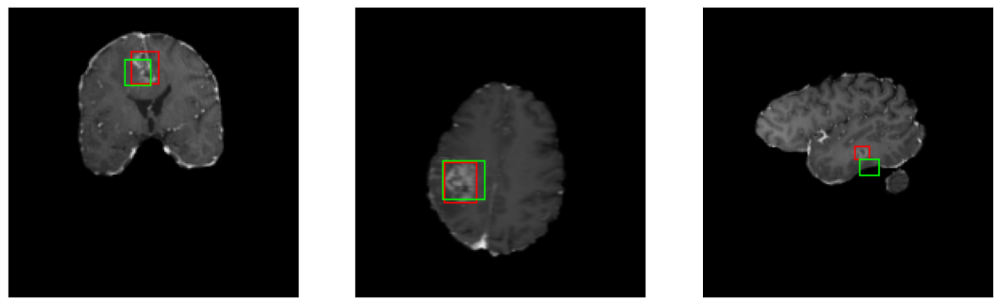

50/50 [==============================] - 7s 144ms/step - loss: 4.0027 - IoU: 0.4314 - val_loss: 3.7081 - val_IoU: 0.5634
Epoch 27/150
7/7 [==============================] - 0s 37ms/step


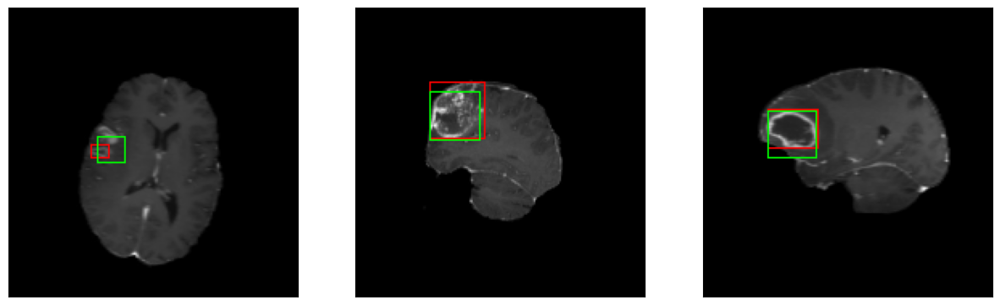

50/50 [==============================] - 7s 133ms/step - loss: 3.8185 - IoU: 0.4491 - val_loss: 3.4176 - val_IoU: 0.6107
Epoch 28/150
7/7 [==============================] - 0s 37ms/step


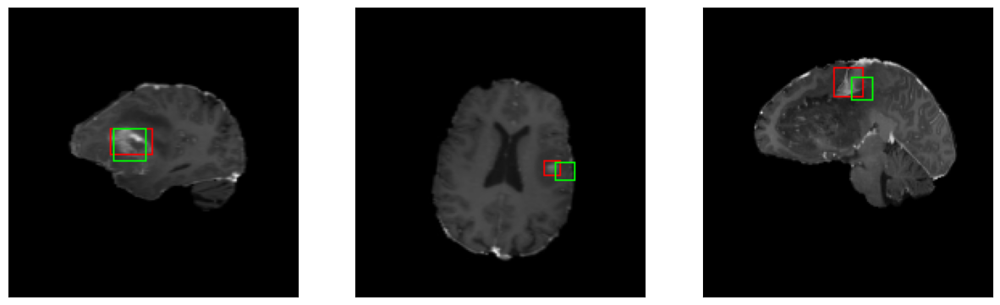

50/50 [==============================] - 7s 137ms/step - loss: 3.7554 - IoU: 0.4596 - val_loss: 4.1501 - val_IoU: 0.4822
Epoch 29/150
7/7 [==============================] - 0s 38ms/step


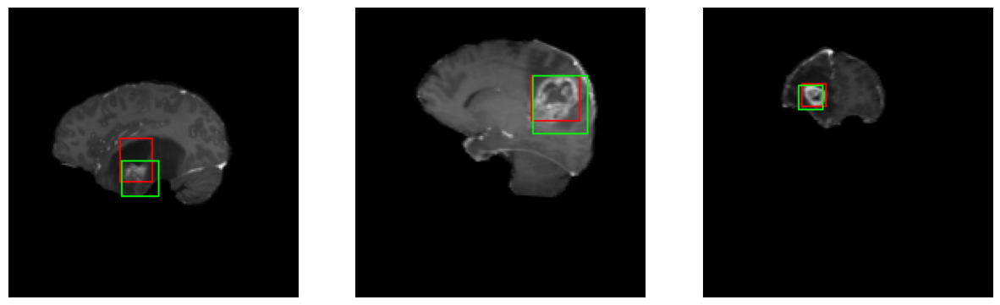

50/50 [==============================] - 7s 144ms/step - loss: 3.7070 - IoU: 0.4720 - val_loss: 4.3693 - val_IoU: 0.5481
Epoch 30/150
7/7 [==============================] - 0s 39ms/step


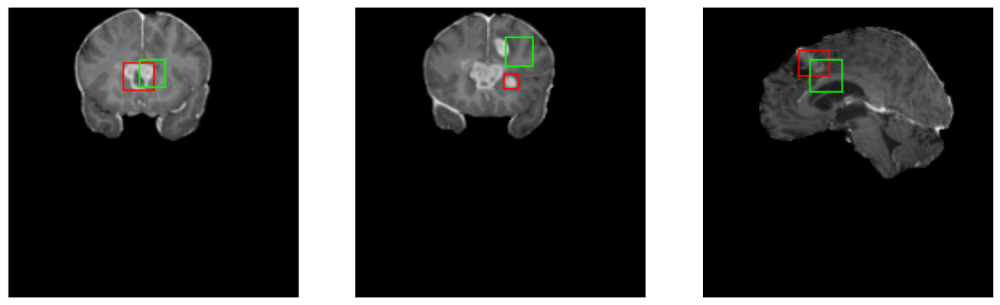

50/50 [==============================] - 7s 143ms/step - loss: 3.8116 - IoU: 0.4500 - val_loss: 4.1119 - val_IoU: 0.5049
Epoch 31/150
7/7 [==============================] - 0s 38ms/step


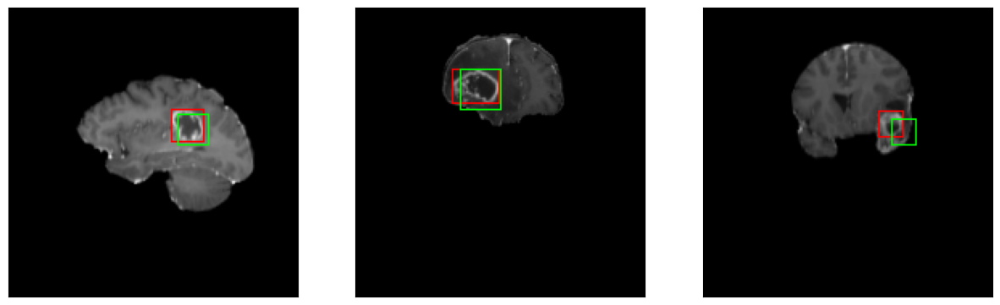

50/50 [==============================] - 7s 139ms/step - loss: 3.7203 - IoU: 0.4607 - val_loss: 4.3456 - val_IoU: 0.4782
Epoch 32/150
7/7 [==============================] - 0s 37ms/step


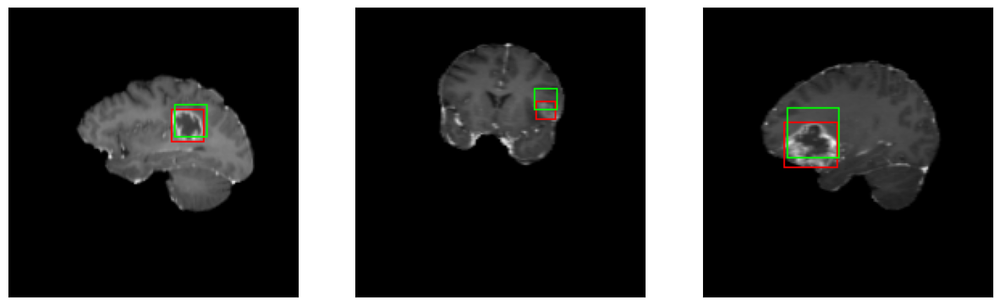

50/50 [==============================] - 7s 148ms/step - loss: 3.7613 - IoU: 0.4467 - val_loss: 4.1877 - val_IoU: 0.4908
Epoch 33/150
7/7 [==============================] - 0s 38ms/step


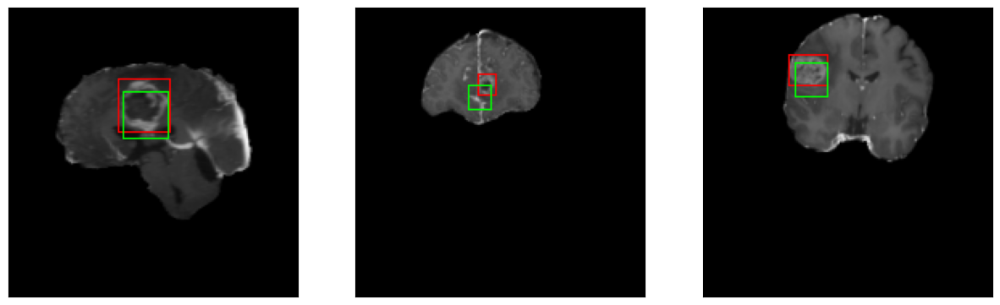

50/50 [==============================] - 7s 135ms/step - loss: 3.5882 - IoU: 0.4874 - val_loss: 5.6260 - val_IoU: 0.3085
Epoch 34/150
7/7 [==============================] - 0s 37ms/step


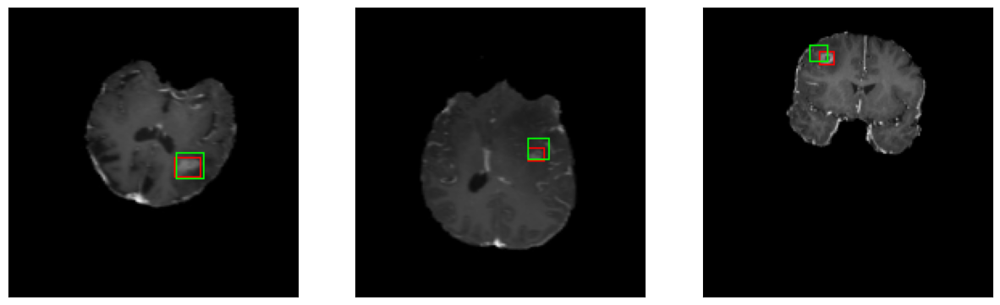

50/50 [==============================] - 7s 145ms/step - loss: 3.5634 - IoU: 0.4826 - val_loss: 3.2545 - val_IoU: 0.6207
Epoch 35/150
7/7 [==============================] - 0s 41ms/step


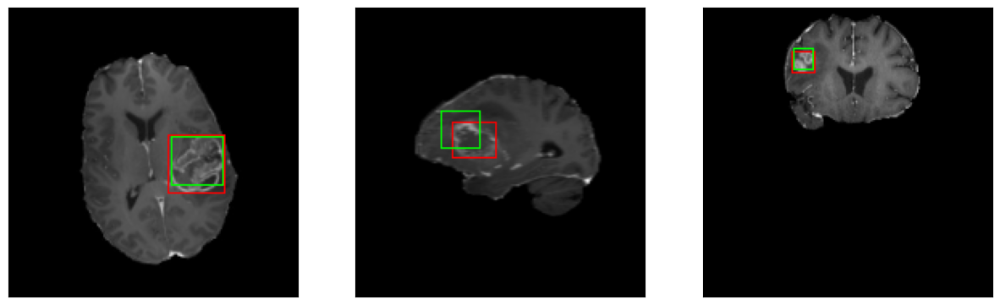

50/50 [==============================] - 7s 144ms/step - loss: 3.4848 - IoU: 0.4956 - val_loss: 4.0089 - val_IoU: 0.5031
Epoch 36/150
7/7 [==============================] - 0s 38ms/step


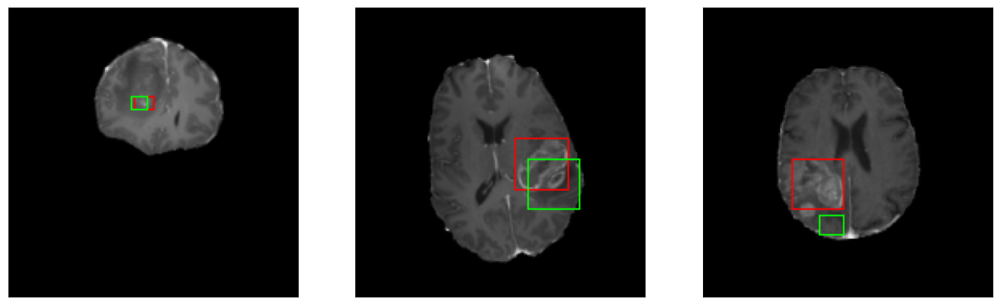

50/50 [==============================] - 7s 134ms/step - loss: 3.5278 - IoU: 0.4771 - val_loss: 4.8306 - val_IoU: 0.4265
Epoch 37/150
7/7 [==============================] - 0s 37ms/step


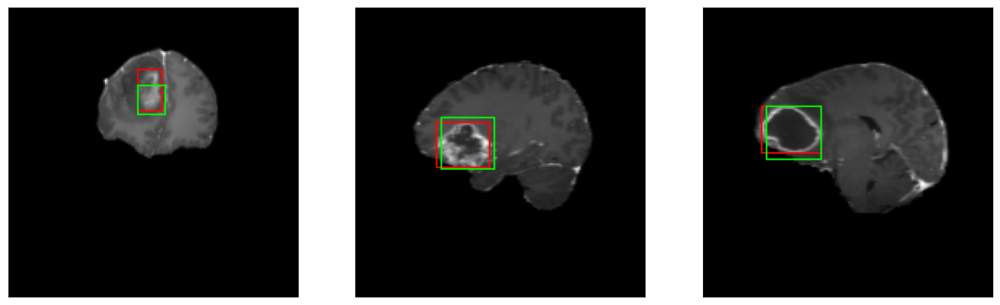

50/50 [==============================] - 8s 155ms/step - loss: 3.4818 - IoU: 0.4945 - val_loss: 3.9015 - val_IoU: 0.5367
Epoch 38/150
7/7 [==============================] - 0s 38ms/step


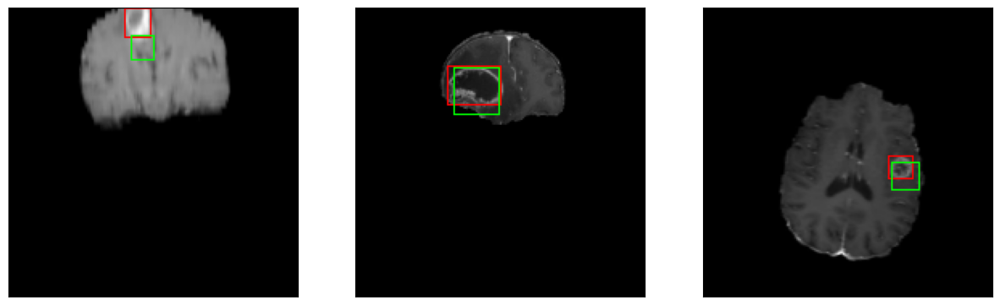

50/50 [==============================] - 7s 136ms/step - loss: 3.6088 - IoU: 0.4819 - val_loss: 3.6696 - val_IoU: 0.5990
Epoch 39/150
7/7 [==============================] - 0s 38ms/step


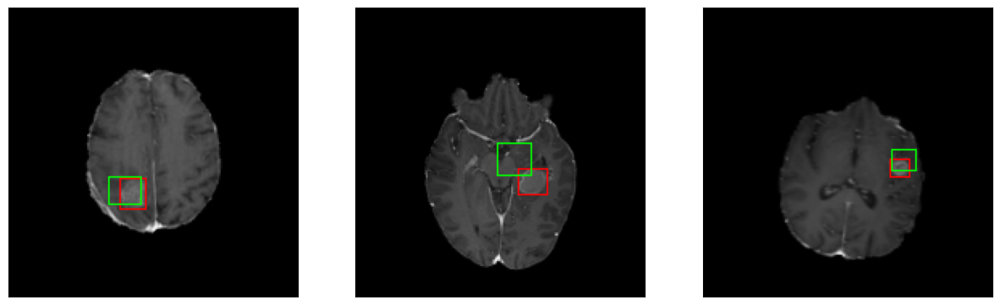

50/50 [==============================] - 8s 151ms/step - loss: 3.4163 - IoU: 0.4972 - val_loss: 4.3399 - val_IoU: 0.4720
Epoch 40/150
7/7 [==============================] - 0s 39ms/step


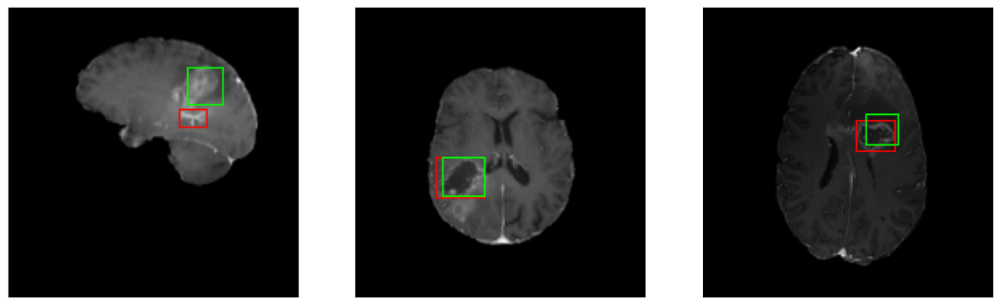

50/50 [==============================] - 7s 141ms/step - loss: 3.3788 - IoU: 0.5055 - val_loss: 4.1399 - val_IoU: 0.5007
Epoch 41/150
7/7 [==============================] - 0s 38ms/step


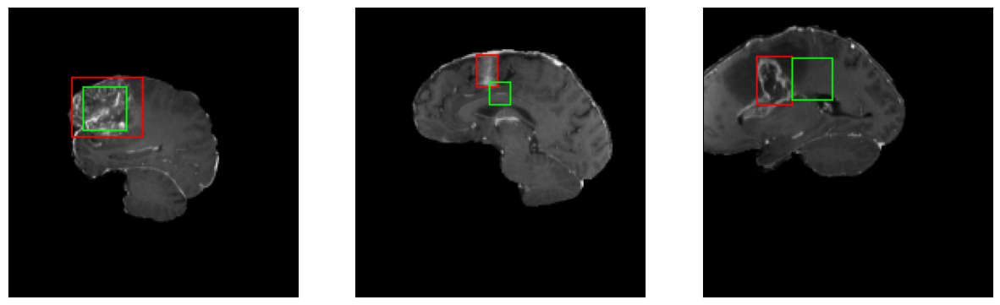

50/50 [==============================] - 7s 136ms/step - loss: 3.2981 - IoU: 0.5067 - val_loss: 4.2691 - val_IoU: 0.4918
Epoch 42/150
7/7 [==============================] - 0s 38ms/step


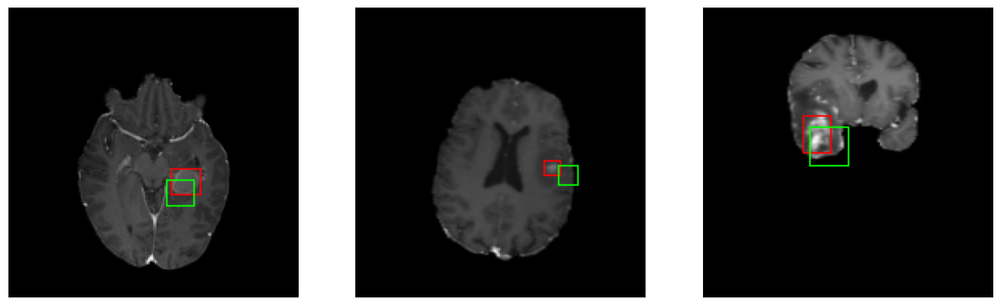

50/50 [==============================] - 7s 143ms/step - loss: 3.3672 - IoU: 0.5007 - val_loss: 4.5397 - val_IoU: 0.4702
Epoch 43/150
7/7 [==============================] - 0s 37ms/step


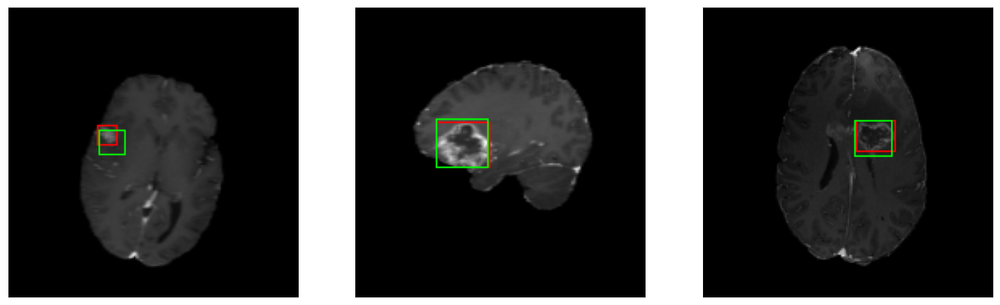

50/50 [==============================] - 7s 146ms/step - loss: 3.4584 - IoU: 0.4906 - val_loss: 3.3455 - val_IoU: 0.6230
Epoch 44/150
7/7 [==============================] - 0s 39ms/step


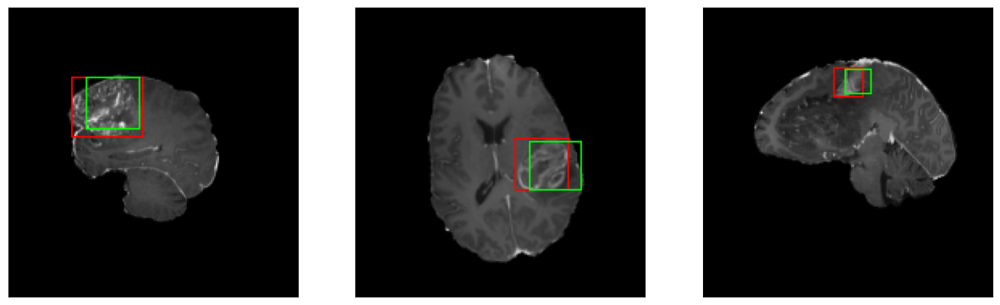

50/50 [==============================] - 7s 142ms/step - loss: 3.3918 - IoU: 0.5058 - val_loss: 4.9311 - val_IoU: 0.4705
Epoch 45/150
7/7 [==============================] - 0s 40ms/step


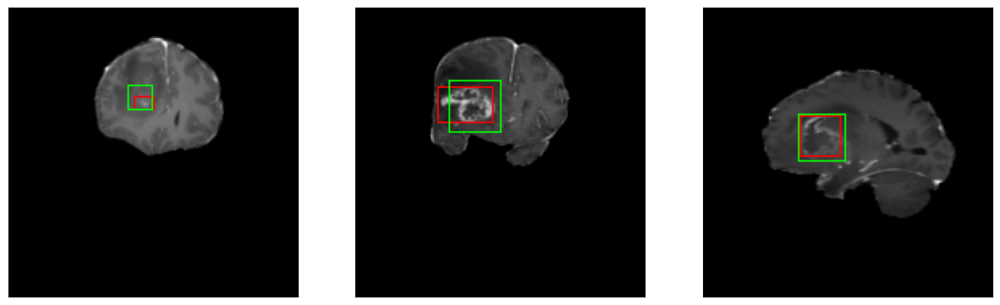

50/50 [==============================] - 7s 141ms/step - loss: 3.4591 - IoU: 0.4971 - val_loss: 4.7294 - val_IoU: 0.5406
Epoch 46/150
7/7 [==============================] - 0s 37ms/step


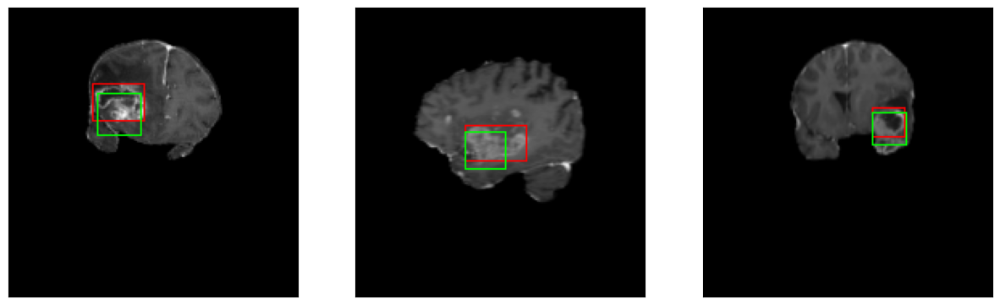

50/50 [==============================] - 7s 147ms/step - loss: 3.2715 - IoU: 0.5148 - val_loss: 4.1361 - val_IoU: 0.4876
Epoch 47/150
7/7 [==============================] - 0s 39ms/step


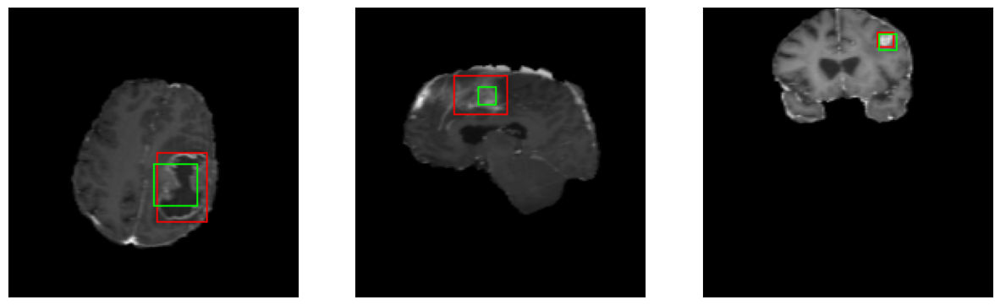

50/50 [==============================] - 7s 150ms/step - loss: 3.2658 - IoU: 0.5150 - val_loss: 4.1176 - val_IoU: 0.5194
Epoch 48/150
7/7 [==============================] - 0s 37ms/step


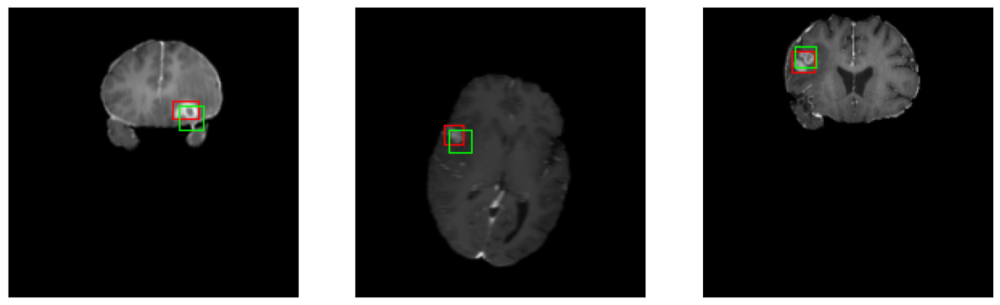

50/50 [==============================] - 7s 137ms/step - loss: 3.2291 - IoU: 0.5234 - val_loss: 4.0912 - val_IoU: 0.5629
Epoch 49/150
7/7 [==============================] - 0s 38ms/step


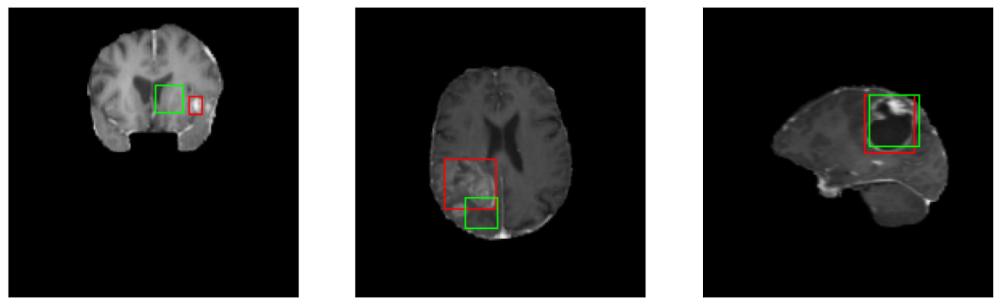

50/50 [==============================] - 7s 137ms/step - loss: 3.1072 - IoU: 0.5326 - val_loss: 3.8581 - val_IoU: 0.5690
Epoch 50/150
7/7 [==============================] - 0s 40ms/step


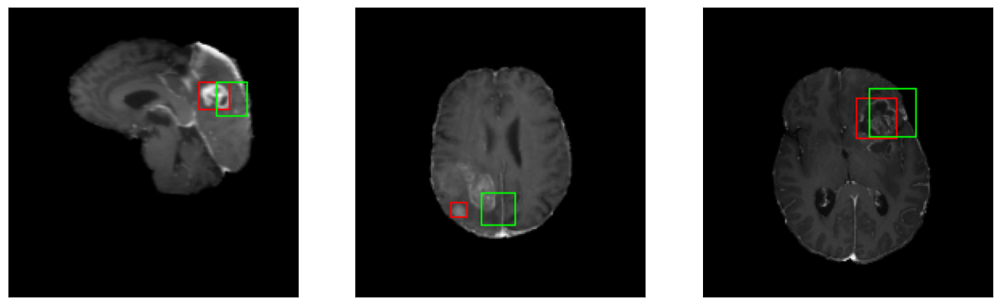

50/50 [==============================] - 7s 150ms/step - loss: 3.4161 - IoU: 0.5036 - val_loss: 5.0182 - val_IoU: 0.4462
Epoch 51/150
7/7 [==============================] - 0s 39ms/step


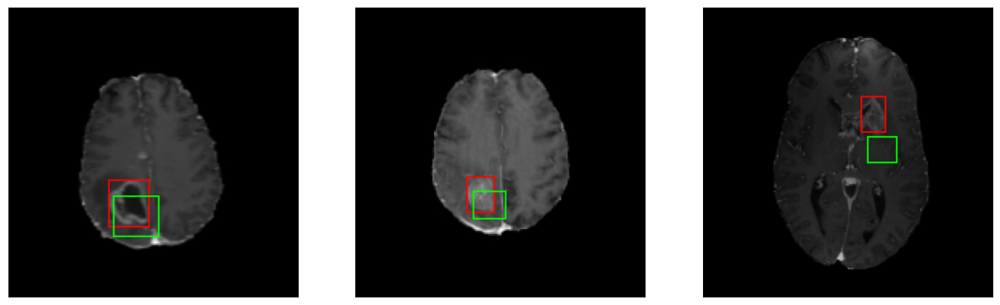

50/50 [==============================] - 7s 138ms/step - loss: 3.1596 - IoU: 0.5358 - val_loss: 4.5102 - val_IoU: 0.4405
Epoch 52/150
7/7 [==============================] - 0s 38ms/step


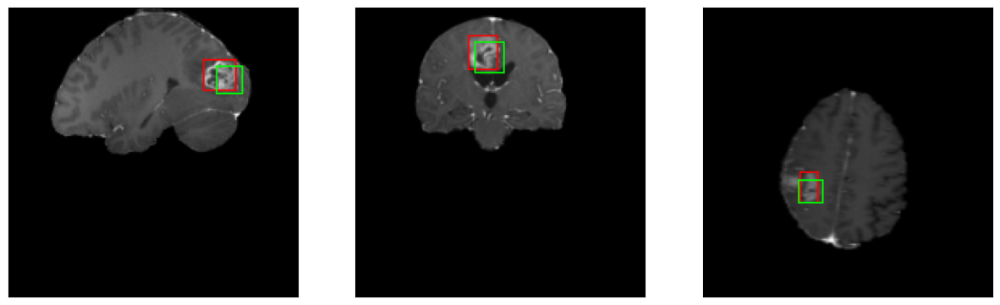

50/50 [==============================] - 7s 145ms/step - loss: 3.2487 - IoU: 0.5258 - val_loss: 4.1696 - val_IoU: 0.5061
Epoch 53/150
7/7 [==============================] - 0s 41ms/step


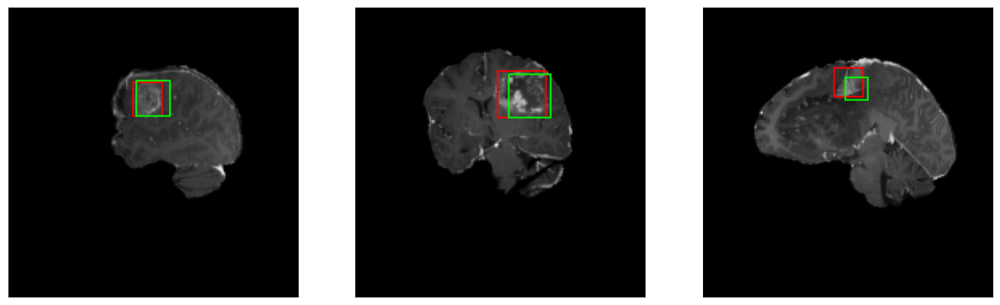

50/50 [==============================] - 7s 148ms/step - loss: 3.1655 - IoU: 0.5328 - val_loss: 3.4827 - val_IoU: 0.6040
Epoch 54/150
7/7 [==============================] - 0s 38ms/step


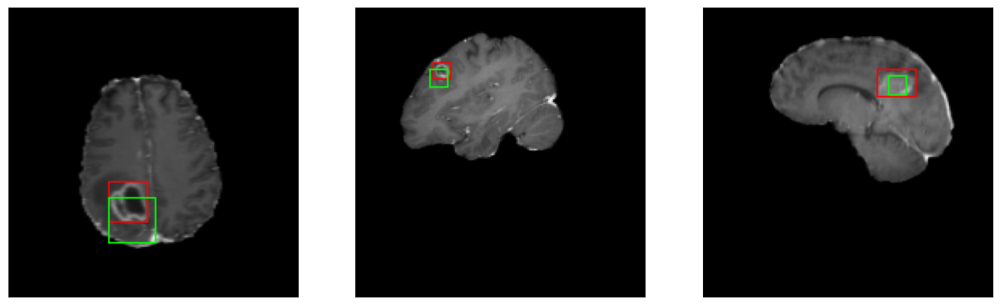

50/50 [==============================] - 7s 144ms/step - loss: 3.1154 - IoU: 0.5320 - val_loss: 3.4902 - val_IoU: 0.6101
Epoch 55/150
7/7 [==============================] - 0s 40ms/step


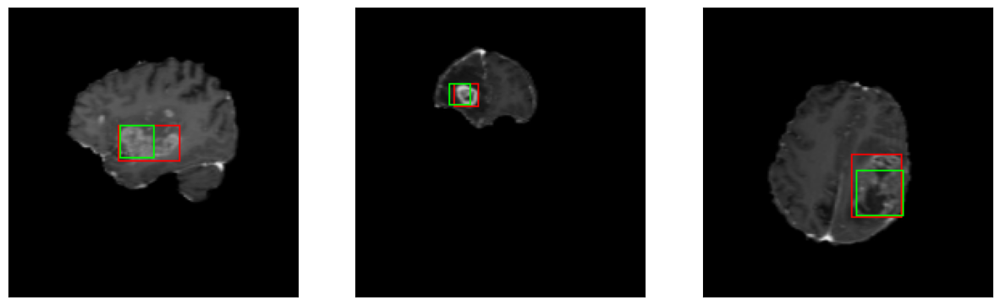

50/50 [==============================] - 7s 140ms/step - loss: 3.2487 - IoU: 0.5222 - val_loss: 3.3886 - val_IoU: 0.5884
Epoch 56/150
7/7 [==============================] - 0s 39ms/step


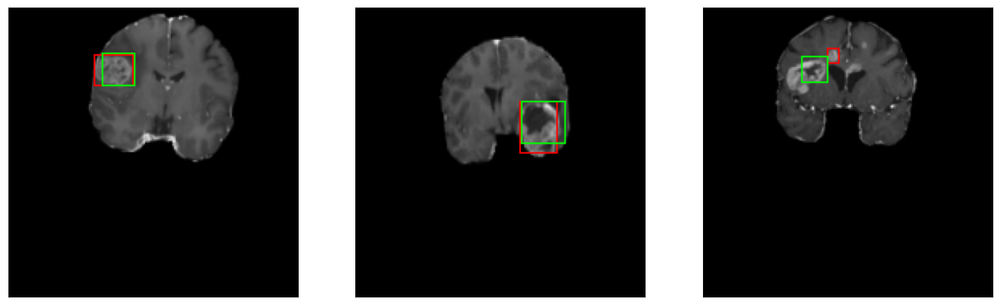

50/50 [==============================] - 8s 151ms/step - loss: 3.0084 - IoU: 0.5453 - val_loss: 3.1071 - val_IoU: 0.6520
Epoch 57/150
7/7 [==============================] - 0s 39ms/step


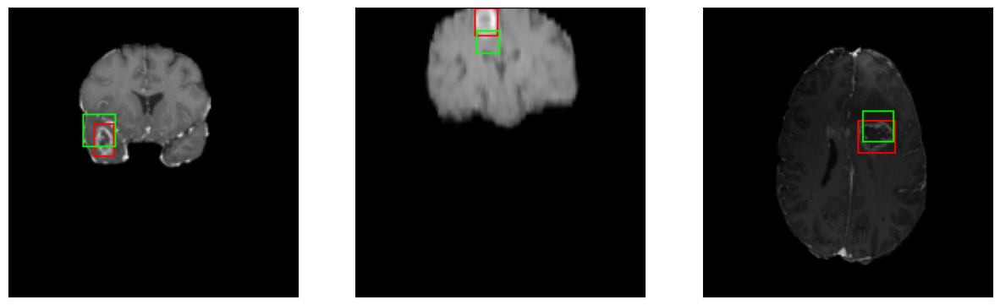

50/50 [==============================] - 7s 139ms/step - loss: 3.0053 - IoU: 0.5470 - val_loss: 3.6175 - val_IoU: 0.5540
Epoch 58/150
7/7 [==============================] - 0s 38ms/step


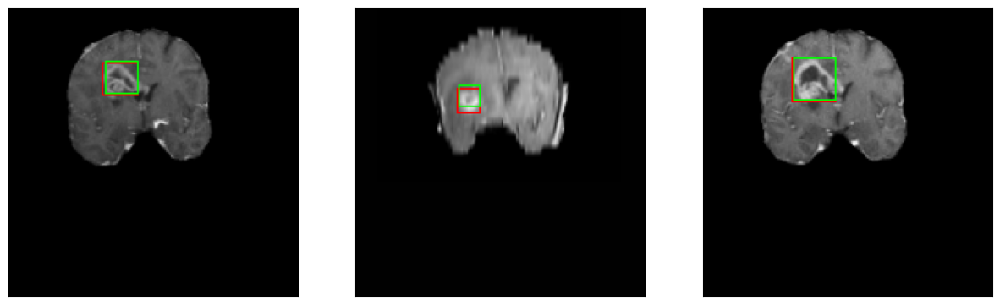

50/50 [==============================] - 8s 153ms/step - loss: 3.1294 - IoU: 0.5342 - val_loss: 3.5800 - val_IoU: 0.5788
Epoch 59/150
7/7 [==============================] - 0s 40ms/step


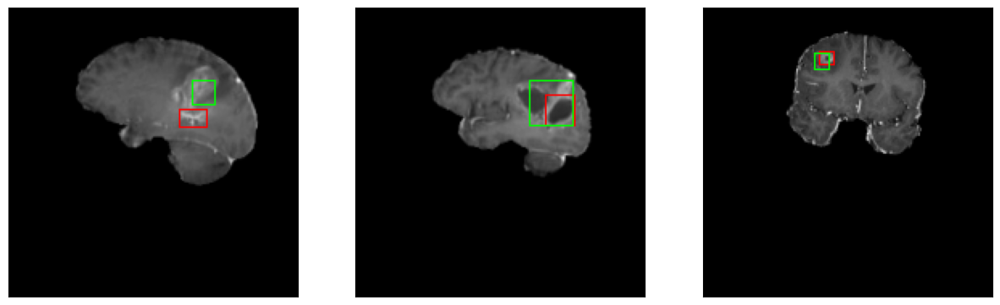

50/50 [==============================] - 7s 146ms/step - loss: 3.1066 - IoU: 0.5375 - val_loss: 3.4537 - val_IoU: 0.5663
Epoch 60/150
7/7 [==============================] - 0s 39ms/step


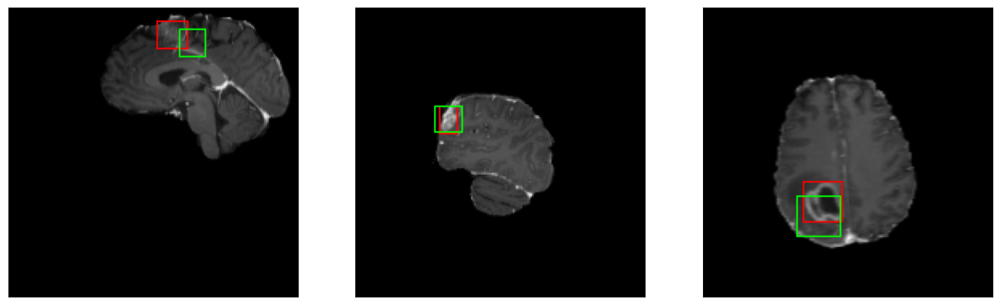

50/50 [==============================] - 7s 138ms/step - loss: 3.2996 - IoU: 0.5140 - val_loss: 3.3740 - val_IoU: 0.6438
Epoch 61/150
7/7 [==============================] - 0s 38ms/step


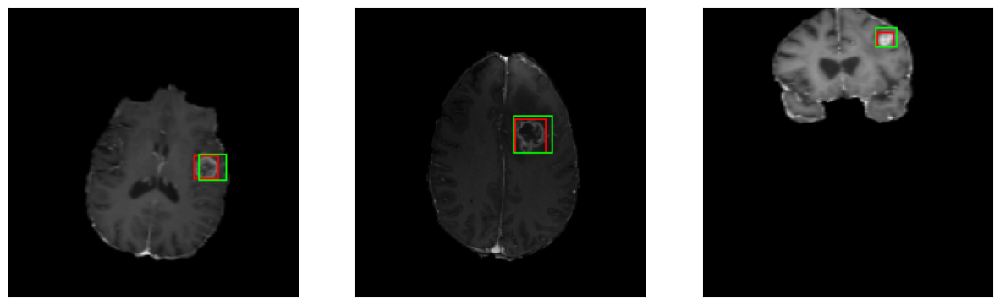

50/50 [==============================] - 8s 158ms/step - loss: 3.0845 - IoU: 0.5409 - val_loss: 3.4851 - val_IoU: 0.5883
Epoch 62/150
7/7 [==============================] - 0s 38ms/step


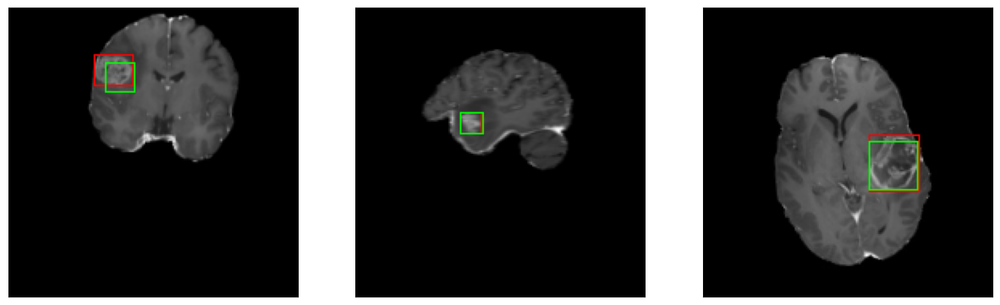

50/50 [==============================] - 7s 140ms/step - loss: 3.1747 - IoU: 0.5262 - val_loss: 3.8023 - val_IoU: 0.5668
Epoch 63/150
7/7 [==============================] - 0s 38ms/step


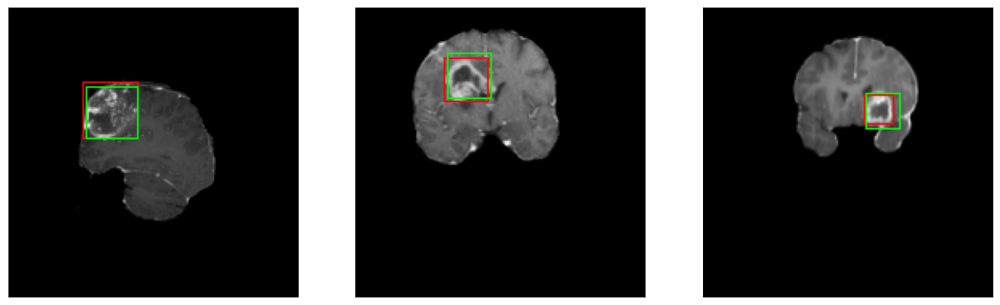

50/50 [==============================] - 8s 156ms/step - loss: 3.0300 - IoU: 0.5476 - val_loss: 3.7664 - val_IoU: 0.5578
Epoch 64/150
7/7 [==============================] - 0s 38ms/step


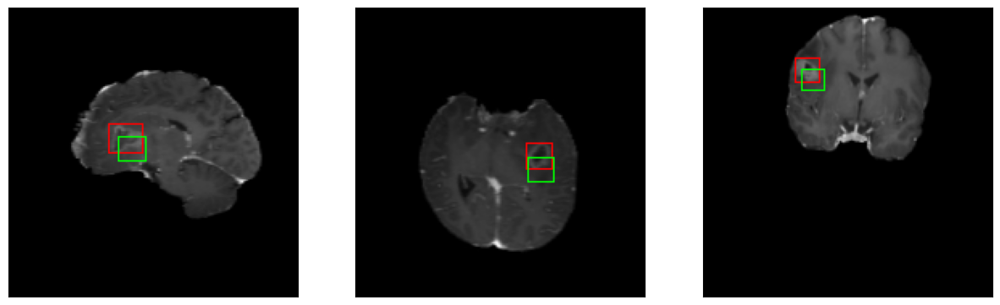

50/50 [==============================] - 7s 138ms/step - loss: 3.1064 - IoU: 0.5426 - val_loss: 4.4341 - val_IoU: 0.4533
Epoch 65/150
7/7 [==============================] - 0s 38ms/step


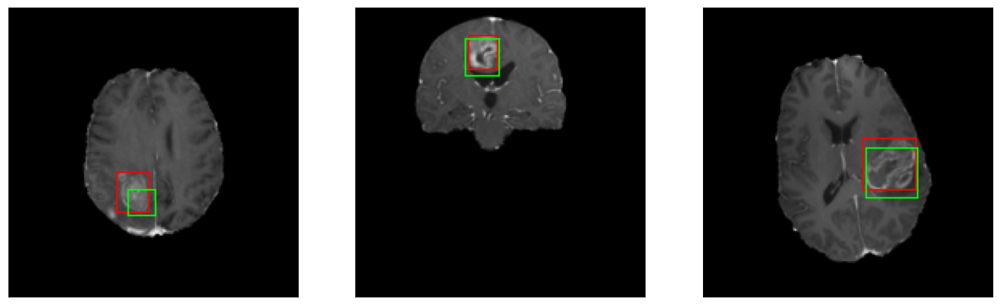

50/50 [==============================] - 7s 136ms/step - loss: 3.1443 - IoU: 0.5347 - val_loss: 3.7265 - val_IoU: 0.5706
Epoch 66/150
7/7 [==============================] - 0s 38ms/step


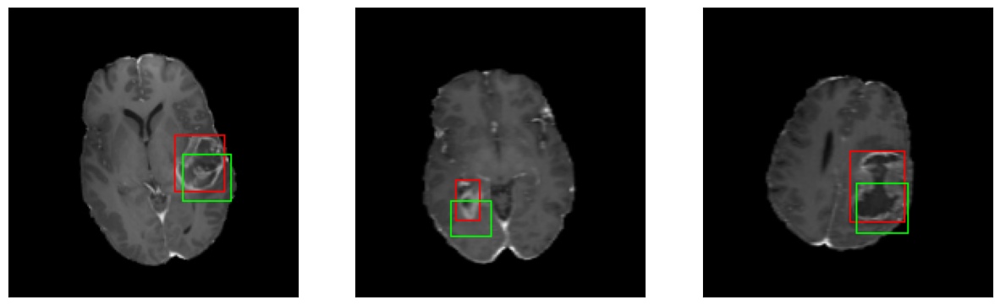

50/50 [==============================] - 8s 156ms/step - loss: 3.0003 - IoU: 0.5457 - val_loss: 4.1206 - val_IoU: 0.4712
Epoch 67/150
7/7 [==============================] - 0s 37ms/step


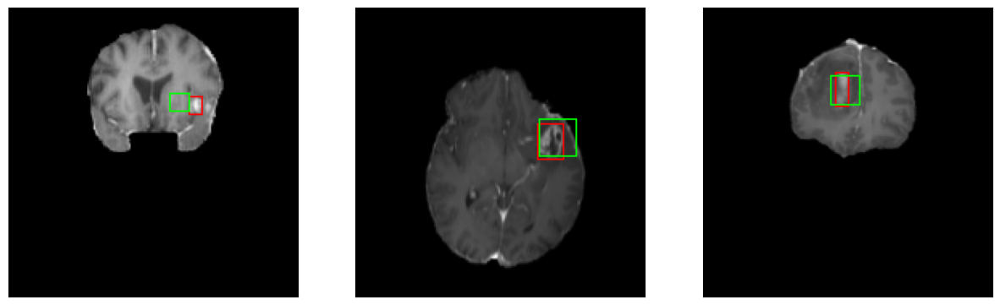

50/50 [==============================] - 7s 142ms/step - loss: 3.0544 - IoU: 0.5366 - val_loss: 3.5538 - val_IoU: 0.6170
Epoch 68/150
7/7 [==============================] - 0s 38ms/step


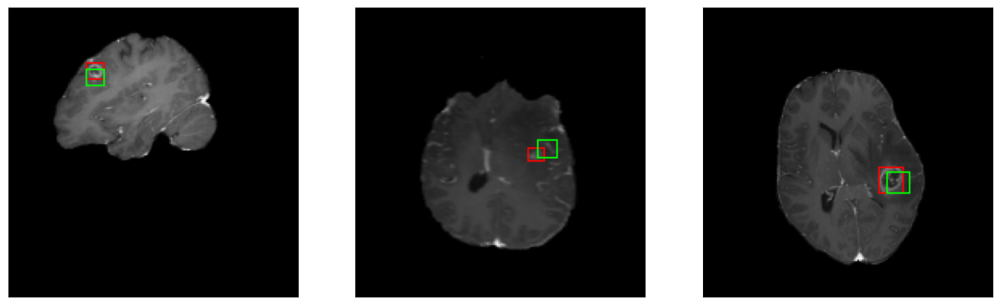

50/50 [==============================] - 8s 155ms/step - loss: 2.9066 - IoU: 0.5532 - val_loss: 3.7639 - val_IoU: 0.5592
Epoch 69/150
7/7 [==============================] - 0s 38ms/step


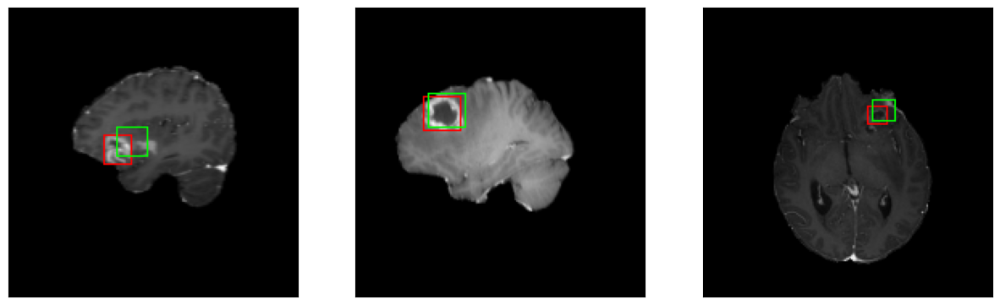

50/50 [==============================] - 8s 152ms/step - loss: 2.9527 - IoU: 0.5452 - val_loss: 4.1228 - val_IoU: 0.4808
Epoch 70/150
7/7 [==============================] - 0s 39ms/step


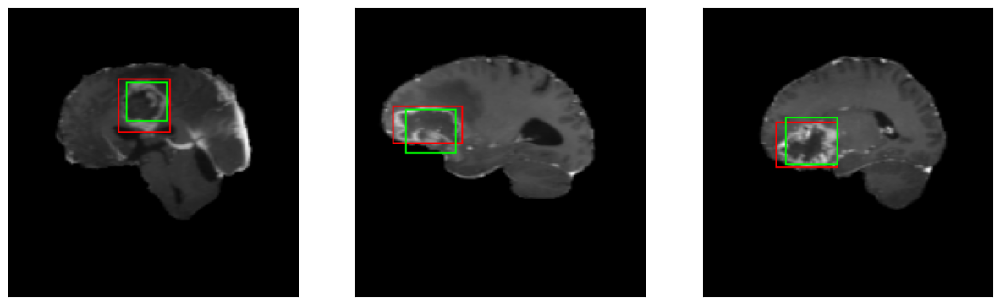

50/50 [==============================] - 7s 137ms/step - loss: 3.0396 - IoU: 0.5322 - val_loss: 3.2909 - val_IoU: 0.6111
Epoch 71/150
7/7 [==============================] - 0s 38ms/step


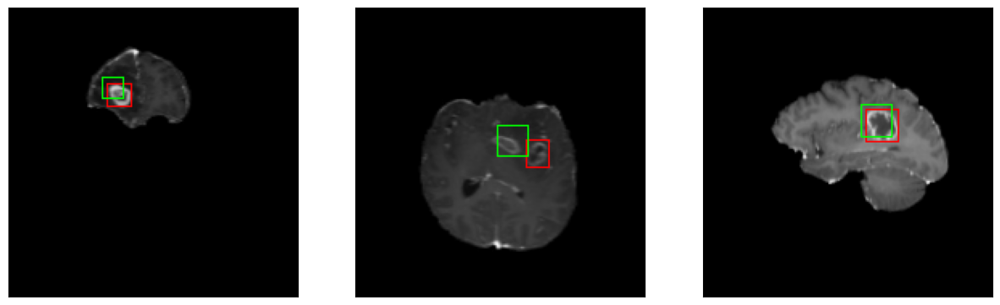

50/50 [==============================] - 8s 156ms/step - loss: 2.9986 - IoU: 0.5463 - val_loss: 3.5740 - val_IoU: 0.5785
Epoch 72/150
7/7 [==============================] - 0s 38ms/step


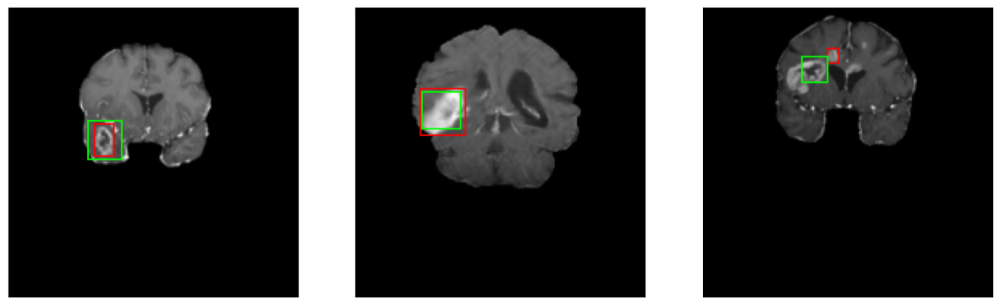

50/50 [==============================] - 7s 140ms/step - loss: 2.9818 - IoU: 0.5361 - val_loss: 3.1051 - val_IoU: 0.6357
Epoch 73/150
7/7 [==============================] - 0s 40ms/step


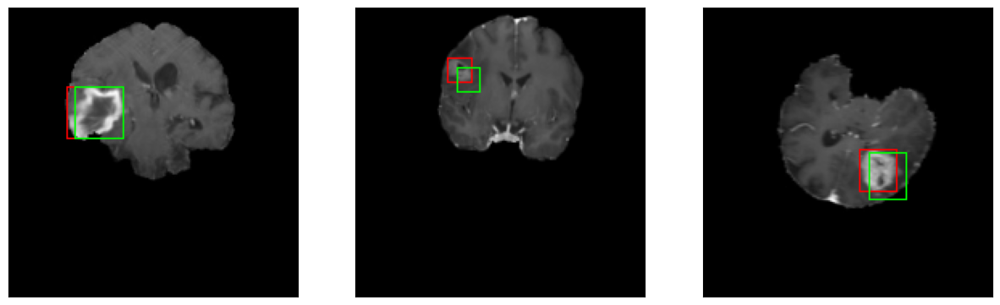

50/50 [==============================] - 8s 154ms/step - loss: 2.8866 - IoU: 0.5455 - val_loss: 4.1091 - val_IoU: 0.5365
Epoch 74/150
7/7 [==============================] - 0s 38ms/step


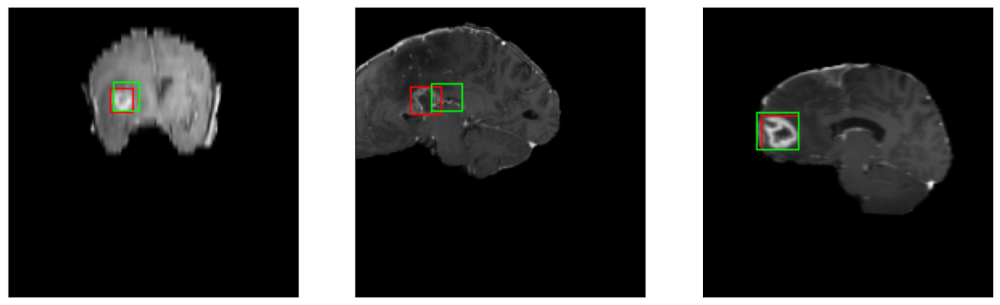

50/50 [==============================] - 7s 139ms/step - loss: 2.9275 - IoU: 0.5452 - val_loss: 3.6262 - val_IoU: 0.5627
Epoch 75/150
7/7 [==============================] - 0s 38ms/step


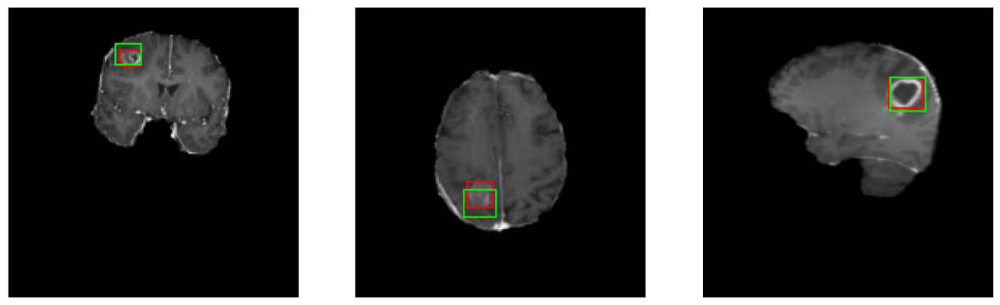

50/50 [==============================] - 7s 140ms/step - loss: 2.8936 - IoU: 0.5483 - val_loss: 2.9398 - val_IoU: 0.6544
Epoch 76/150
7/7 [==============================] - 0s 39ms/step


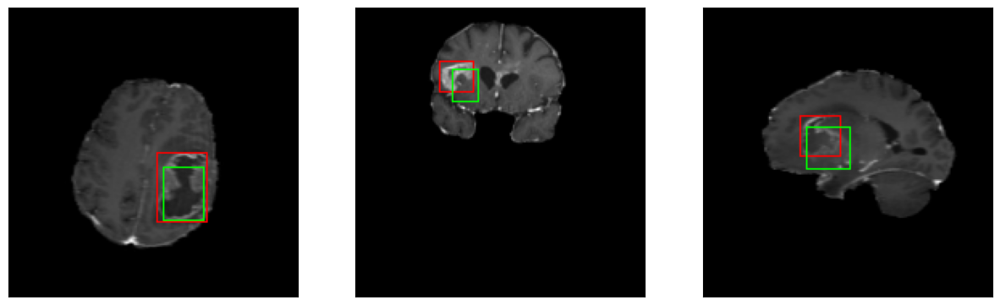

50/50 [==============================] - 8s 159ms/step - loss: 2.8696 - IoU: 0.5410 - val_loss: 4.3748 - val_IoU: 0.4777
Epoch 77/150
7/7 [==============================] - 0s 41ms/step


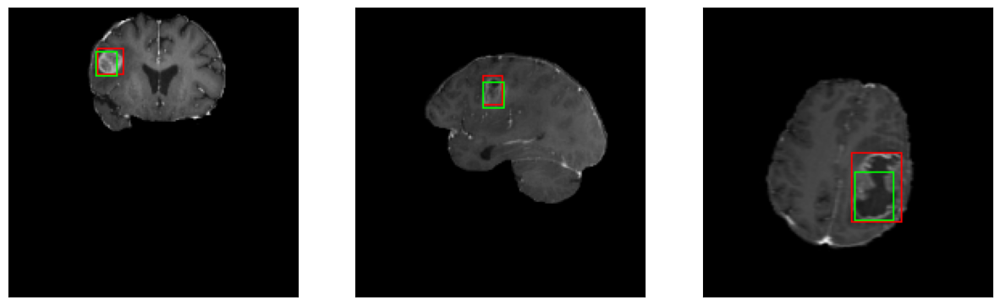

50/50 [==============================] - 7s 150ms/step - loss: 2.7842 - IoU: 0.5518 - val_loss: 3.3477 - val_IoU: 0.5993
Epoch 78/150
7/7 [==============================] - 0s 39ms/step


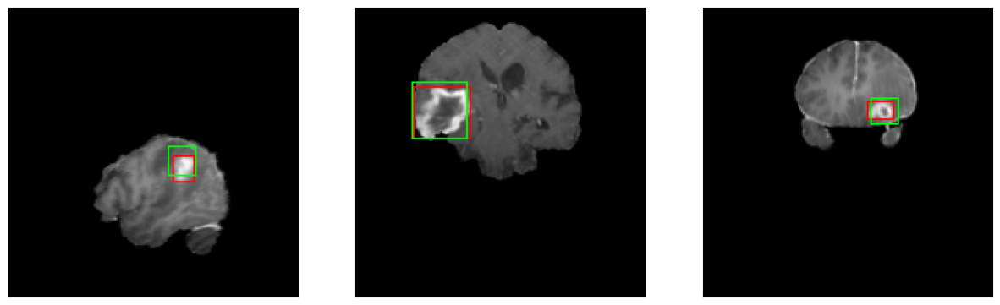

50/50 [==============================] - 8s 156ms/step - loss: 2.8102 - IoU: 0.5516 - val_loss: 3.9195 - val_IoU: 0.5679
Epoch 79/150
7/7 [==============================] - 0s 42ms/step


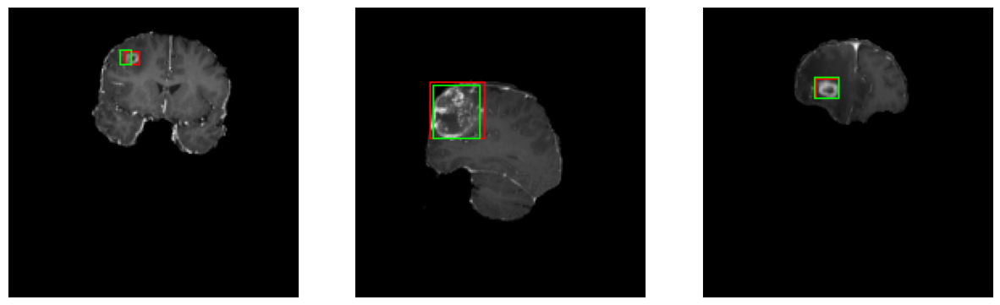

50/50 [==============================] - 7s 149ms/step - loss: 2.7901 - IoU: 0.5514 - val_loss: 3.3314 - val_IoU: 0.6267
Epoch 80/150
7/7 [==============================] - 0s 39ms/step


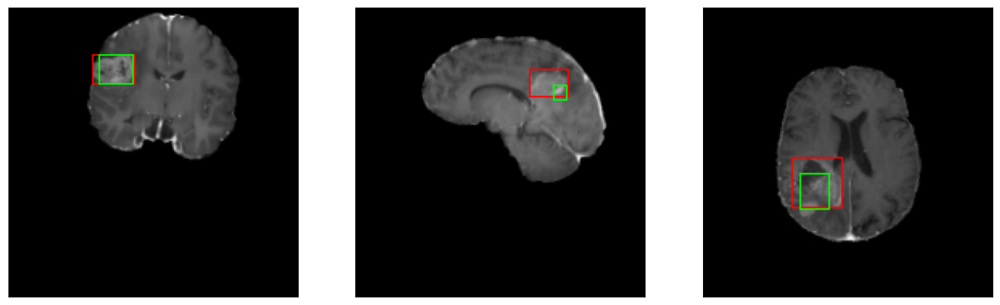

50/50 [==============================] - 8s 151ms/step - loss: 2.7834 - IoU: 0.5499 - val_loss: 3.3677 - val_IoU: 0.5915
Epoch 81/150
7/7 [==============================] - 0s 40ms/step


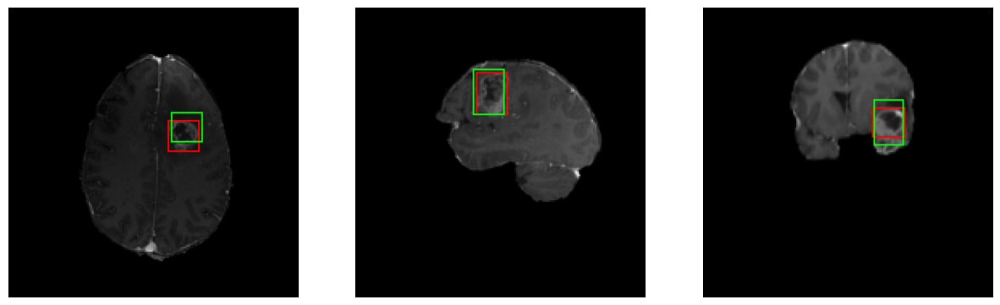

50/50 [==============================] - 8s 162ms/step - loss: 2.8270 - IoU: 0.5536 - val_loss: 3.7329 - val_IoU: 0.5038
Epoch 82/150
7/7 [==============================] - 0s 39ms/step


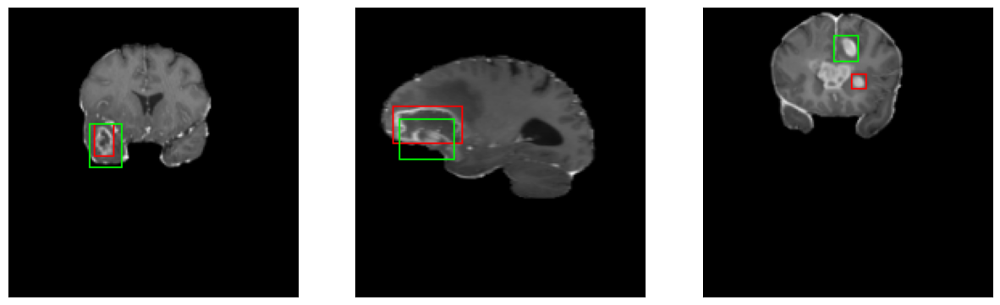

50/50 [==============================] - 7s 138ms/step - loss: 2.6760 - IoU: 0.5563 - val_loss: 3.2627 - val_IoU: 0.6203
Epoch 83/150
7/7 [==============================] - 0s 39ms/step


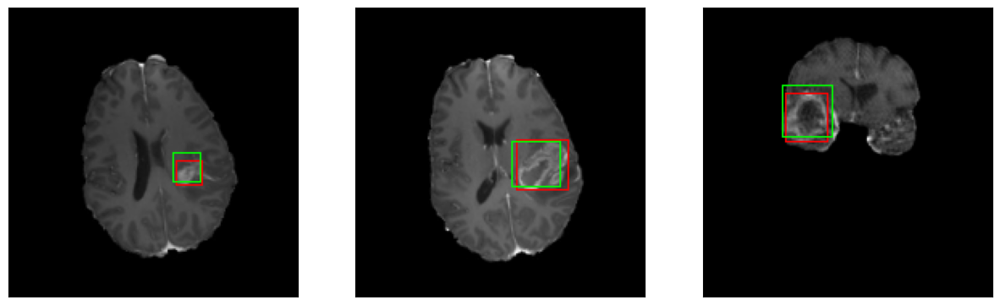

50/50 [==============================] - 8s 161ms/step - loss: 2.7095 - IoU: 0.5596 - val_loss: 3.4452 - val_IoU: 0.5723
Epoch 84/150
7/7 [==============================] - 0s 38ms/step


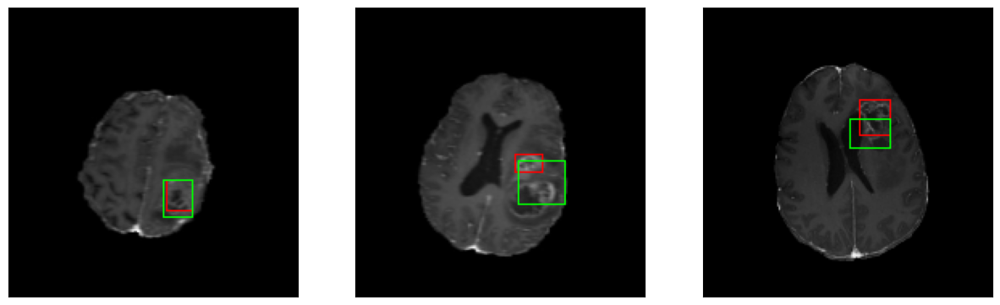

50/50 [==============================] - 7s 145ms/step - loss: 2.6721 - IoU: 0.5717 - val_loss: 3.2710 - val_IoU: 0.6027
Epoch 85/150
7/7 [==============================] - 0s 38ms/step


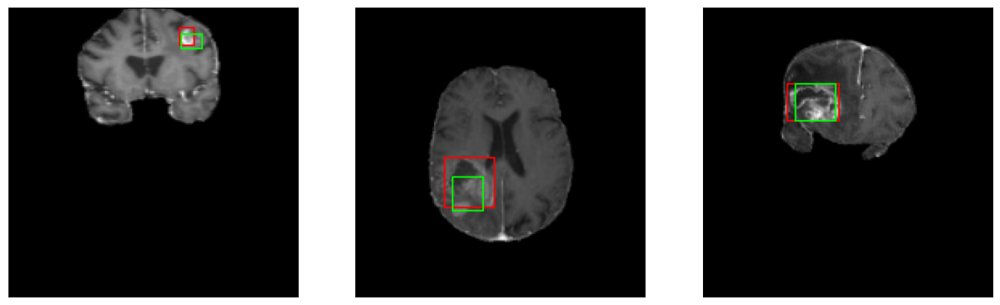

50/50 [==============================] - 8s 158ms/step - loss: 2.7030 - IoU: 0.5555 - val_loss: 3.3809 - val_IoU: 0.5857
Epoch 86/150
7/7 [==============================] - 0s 39ms/step


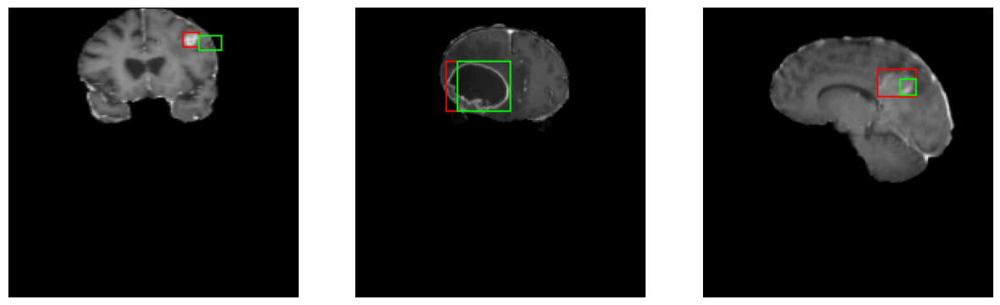

50/50 [==============================] - 7s 141ms/step - loss: 2.7215 - IoU: 0.5563 - val_loss: 3.4726 - val_IoU: 0.5608
Epoch 87/150
7/7 [==============================] - 0s 38ms/step


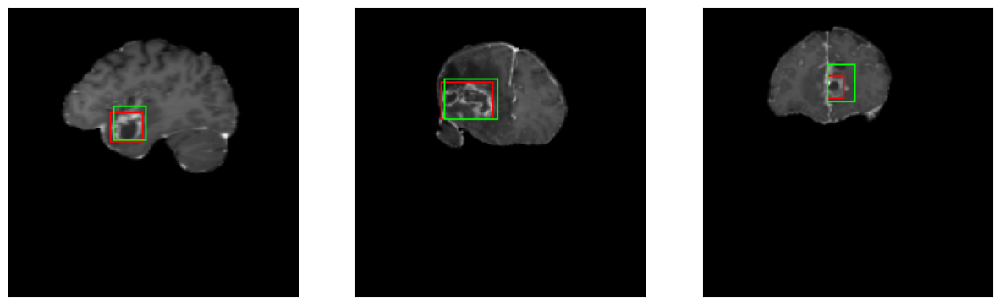

50/50 [==============================] - 8s 152ms/step - loss: 2.5962 - IoU: 0.5704 - val_loss: 3.1508 - val_IoU: 0.6012
Epoch 88/150
7/7 [==============================] - 0s 38ms/step


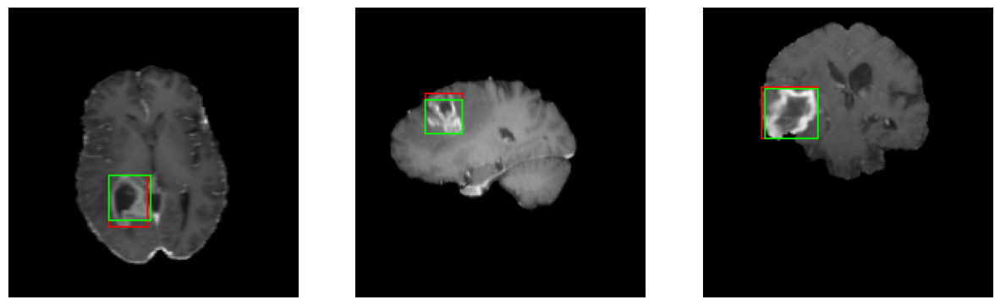

50/50 [==============================] - 7s 142ms/step - loss: 2.6067 - IoU: 0.5627 - val_loss: 3.3972 - val_IoU: 0.5768
Epoch 89/150
7/7 [==============================] - 0s 39ms/step


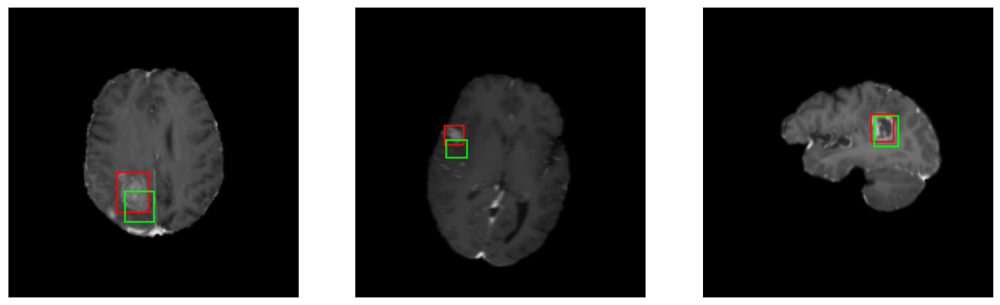

50/50 [==============================] - 8s 156ms/step - loss: 2.7247 - IoU: 0.5568 - val_loss: 3.3818 - val_IoU: 0.5642
Epoch 90/150
7/7 [==============================] - 0s 41ms/step


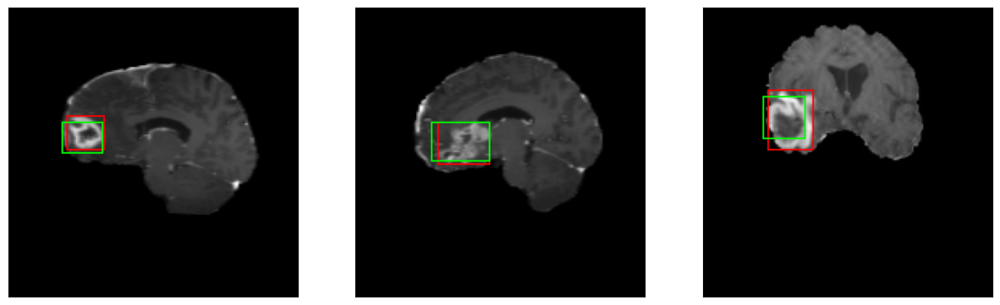

50/50 [==============================] - 7s 145ms/step - loss: 2.6328 - IoU: 0.5626 - val_loss: 3.1679 - val_IoU: 0.5887
Epoch 91/150
7/7 [==============================] - 0s 39ms/step


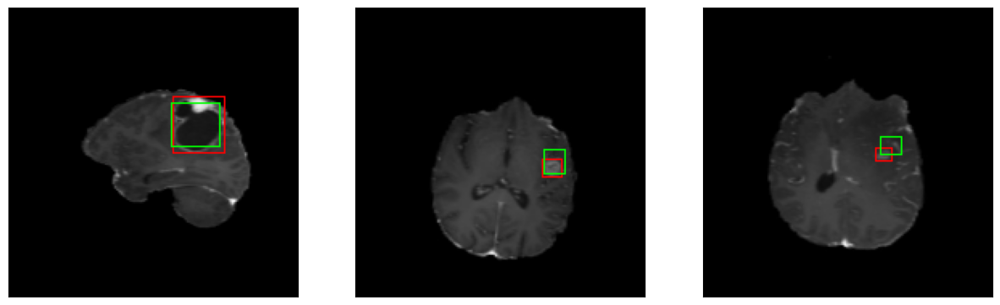

50/50 [==============================] - 7s 144ms/step - loss: 2.6768 - IoU: 0.5667 - val_loss: 2.9968 - val_IoU: 0.6261
Epoch 92/150
7/7 [==============================] - 0s 39ms/step


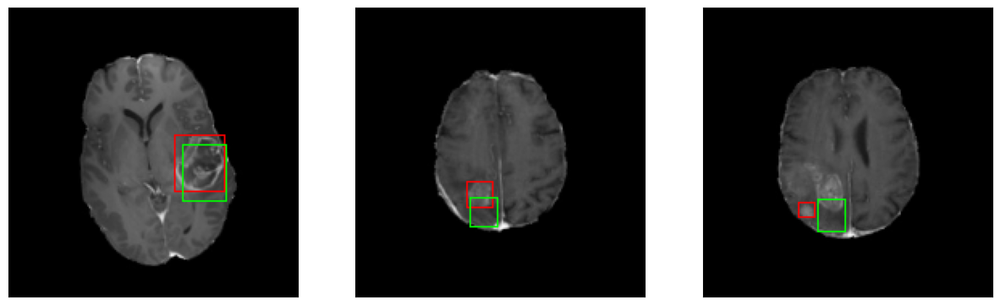

50/50 [==============================] - 8s 154ms/step - loss: 2.6236 - IoU: 0.5643 - val_loss: 3.9585 - val_IoU: 0.5173
Epoch 93/150
7/7 [==============================] - 0s 39ms/step


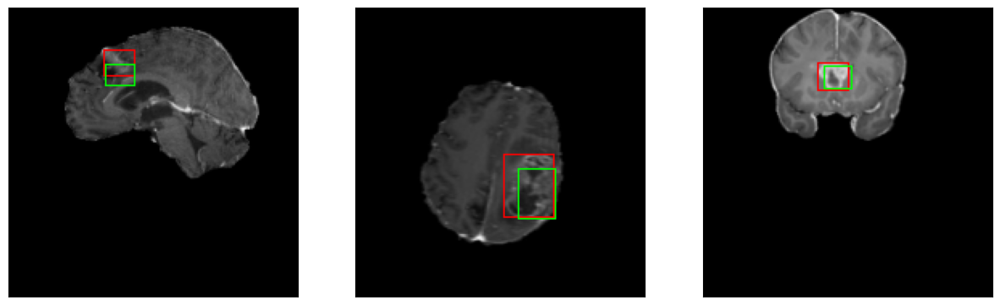

50/50 [==============================] - 7s 148ms/step - loss: 2.7330 - IoU: 0.5532 - val_loss: 3.0756 - val_IoU: 0.6205
Epoch 94/150
7/7 [==============================] - 0s 38ms/step


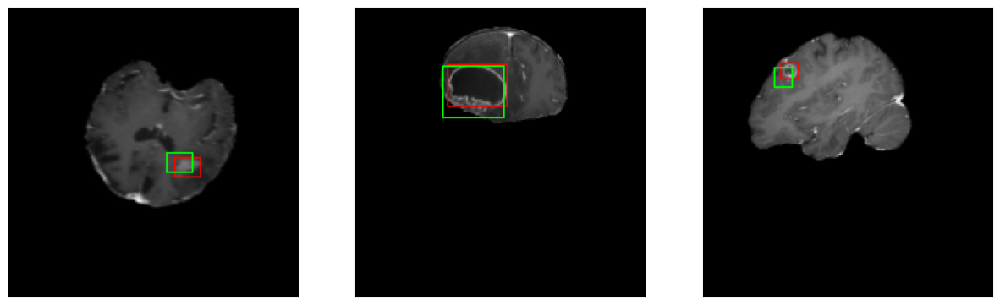

50/50 [==============================] - 8s 163ms/step - loss: 2.5313 - IoU: 0.5736 - val_loss: 3.2761 - val_IoU: 0.5954
Epoch 95/150
7/7 [==============================] - 0s 39ms/step


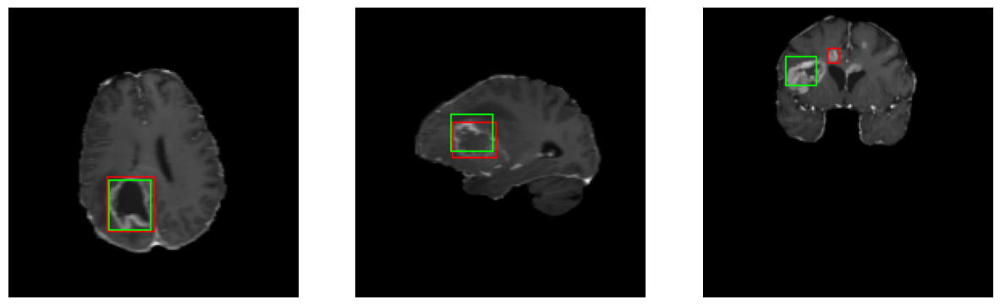

50/50 [==============================] - 8s 152ms/step - loss: 2.6620 - IoU: 0.5584 - val_loss: 3.0247 - val_IoU: 0.5853
Epoch 96/150
7/7 [==============================] - 0s 39ms/step


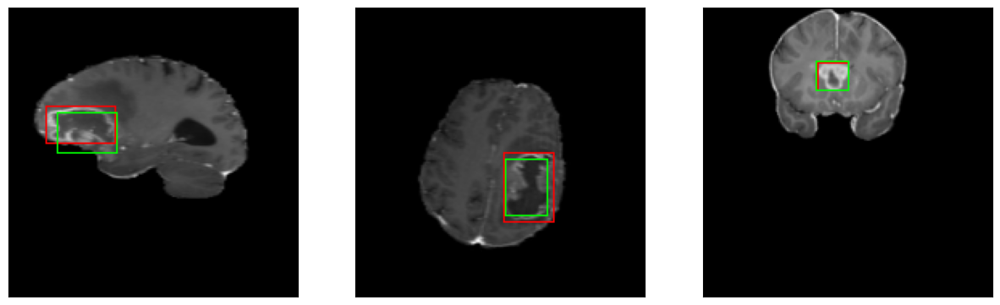

50/50 [==============================] - 7s 144ms/step - loss: 2.7436 - IoU: 0.5509 - val_loss: 3.2933 - val_IoU: 0.6210
Epoch 97/150
7/7 [==============================] - 0s 41ms/step


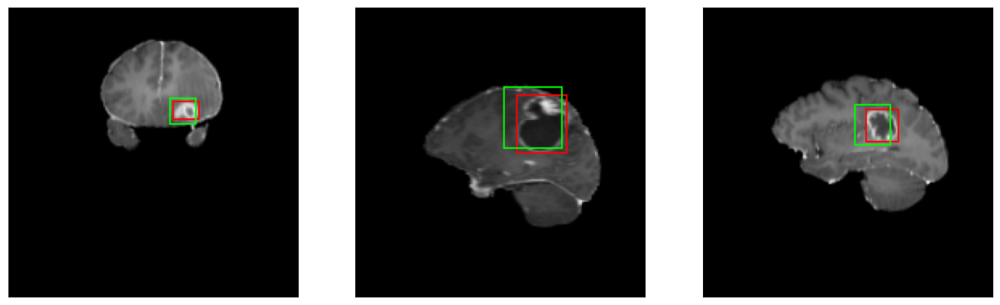

50/50 [==============================] - 8s 152ms/step - loss: 2.6268 - IoU: 0.5654 - val_loss: 3.7102 - val_IoU: 0.5885
Epoch 98/150
7/7 [==============================] - 0s 39ms/step


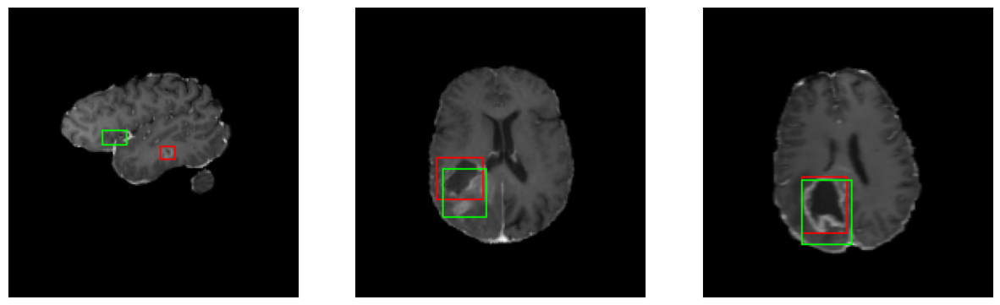

50/50 [==============================] - 7s 147ms/step - loss: 2.6149 - IoU: 0.5647 - val_loss: 2.8189 - val_IoU: 0.6735
Epoch 99/150
7/7 [==============================] - 0s 39ms/step


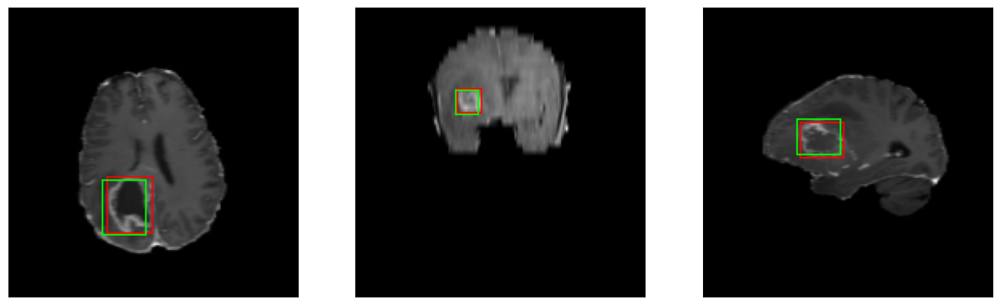

50/50 [==============================] - 8s 151ms/step - loss: 2.6321 - IoU: 0.5660 - val_loss: 2.7795 - val_IoU: 0.6412
Epoch 100/150
7/7 [==============================] - 0s 38ms/step


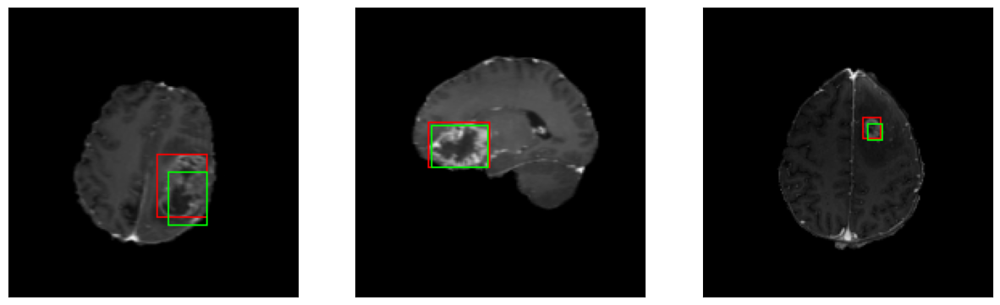

50/50 [==============================] - 8s 153ms/step - loss: 2.4807 - IoU: 0.5808 - val_loss: 3.0288 - val_IoU: 0.6372
Epoch 101/150
7/7 [==============================] - 0s 38ms/step


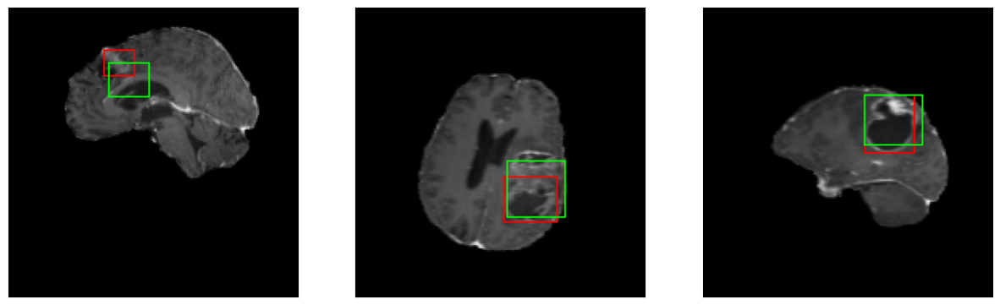

50/50 [==============================] - 8s 153ms/step - loss: 2.5194 - IoU: 0.5734 - val_loss: 4.0563 - val_IoU: 0.5081
Epoch 102/150
7/7 [==============================] - 0s 38ms/step


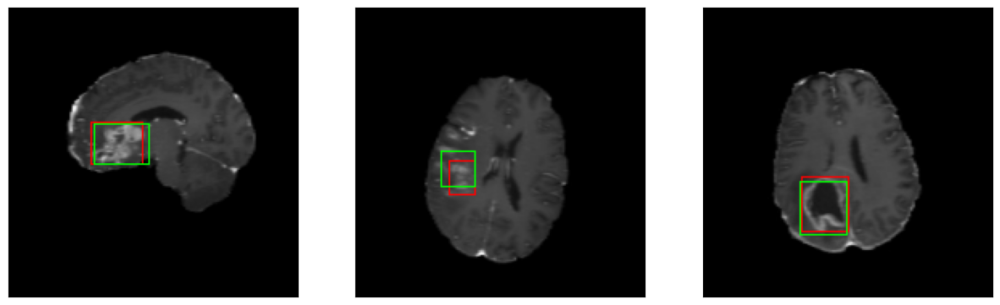

50/50 [==============================] - 8s 162ms/step - loss: 2.5072 - IoU: 0.5723 - val_loss: 3.2584 - val_IoU: 0.5729
Epoch 103/150
7/7 [==============================] - 0s 39ms/step


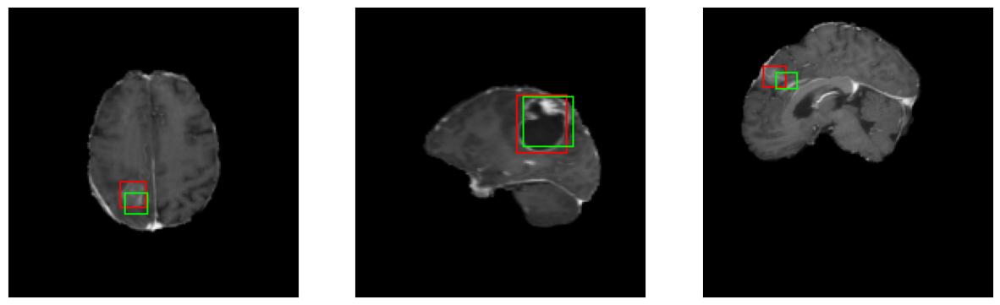

50/50 [==============================] - 8s 154ms/step - loss: 2.4811 - IoU: 0.5716 - val_loss: 3.2831 - val_IoU: 0.5796
Epoch 104/150
7/7 [==============================] - 0s 39ms/step


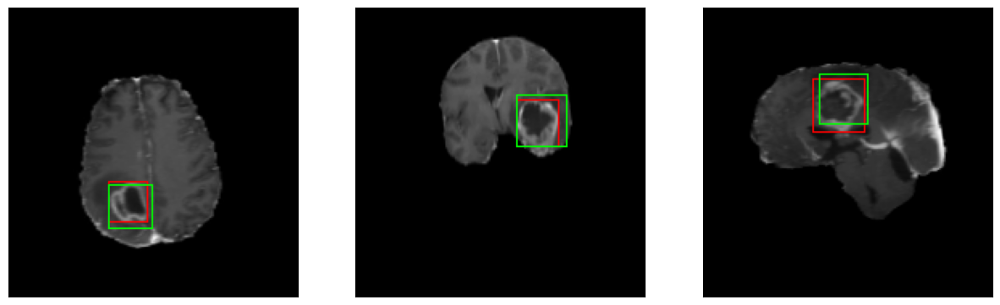

50/50 [==============================] - 8s 161ms/step - loss: 2.4905 - IoU: 0.5764 - val_loss: 3.1085 - val_IoU: 0.6527
Epoch 105/150
7/7 [==============================] - 0s 41ms/step


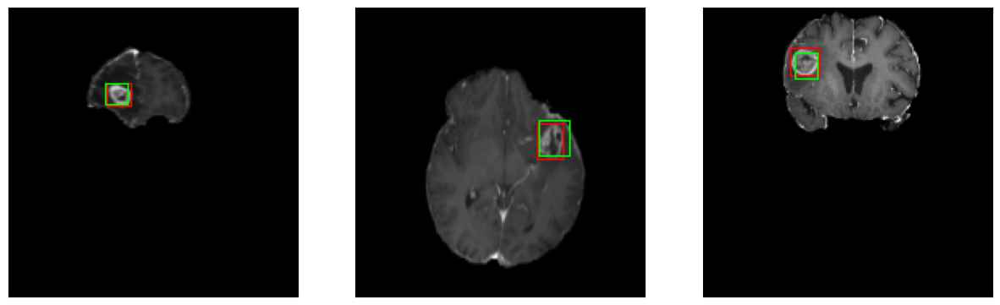

50/50 [==============================] - 7s 149ms/step - loss: 2.5184 - IoU: 0.5756 - val_loss: 2.7965 - val_IoU: 0.6483
Epoch 106/150
7/7 [==============================] - 0s 38ms/step


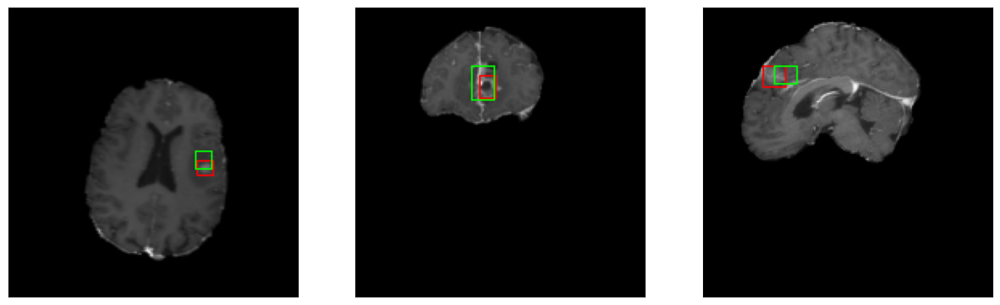

50/50 [==============================] - 7s 145ms/step - loss: 2.4768 - IoU: 0.5770 - val_loss: 2.9178 - val_IoU: 0.6327
Epoch 107/150
7/7 [==============================] - 0s 39ms/step


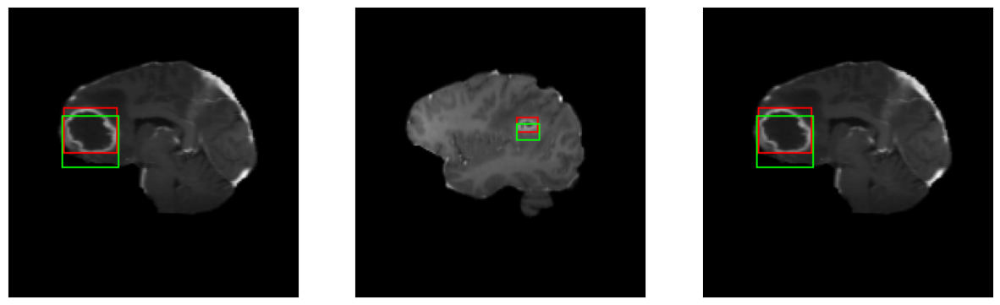

50/50 [==============================] - 8s 155ms/step - loss: 2.5728 - IoU: 0.5692 - val_loss: 3.4730 - val_IoU: 0.5614
Epoch 108/150
7/7 [==============================] - 0s 39ms/step


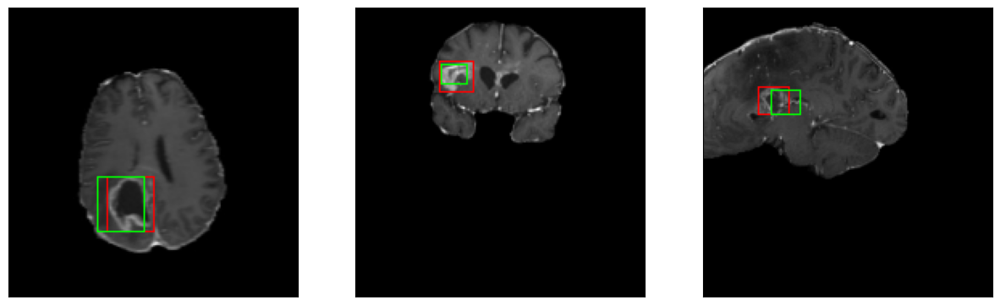

50/50 [==============================] - 7s 147ms/step - loss: 2.5608 - IoU: 0.5637 - val_loss: 3.3712 - val_IoU: 0.5375
Epoch 109/150
7/7 [==============================] - 0s 38ms/step


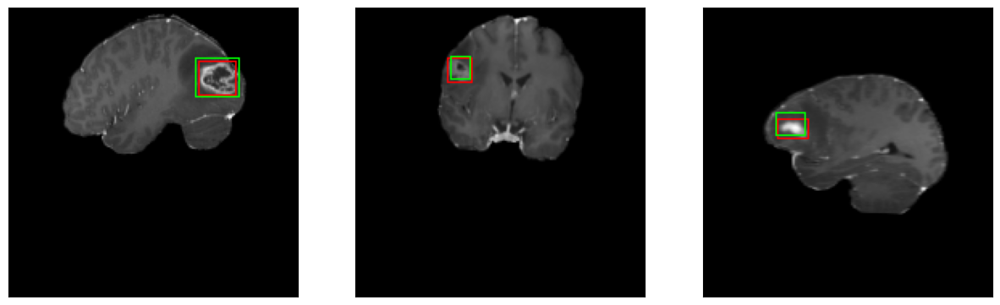

50/50 [==============================] - 7s 144ms/step - loss: 2.4695 - IoU: 0.5770 - val_loss: 3.2647 - val_IoU: 0.6100
Epoch 110/150
7/7 [==============================] - 0s 40ms/step


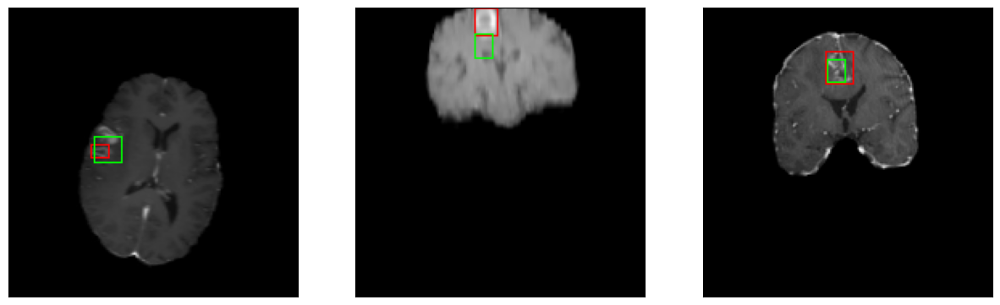

50/50 [==============================] - 8s 154ms/step - loss: 2.5283 - IoU: 0.5722 - val_loss: 3.6448 - val_IoU: 0.5325
Epoch 111/150
7/7 [==============================] - 0s 38ms/step


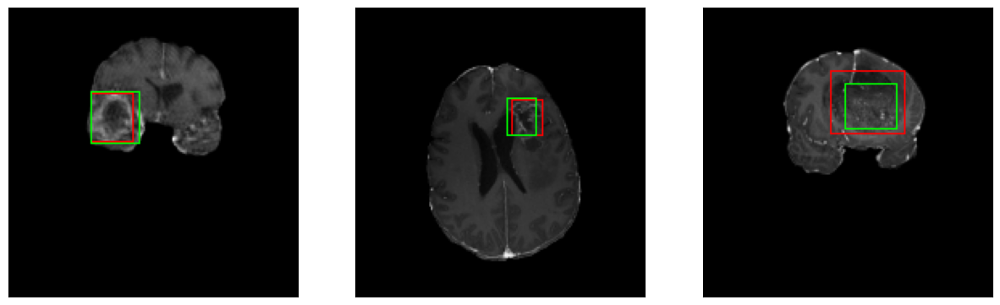

50/50 [==============================] - 7s 145ms/step - loss: 2.5511 - IoU: 0.5662 - val_loss: 3.2318 - val_IoU: 0.6383
Epoch 112/150
7/7 [==============================] - 0s 42ms/step


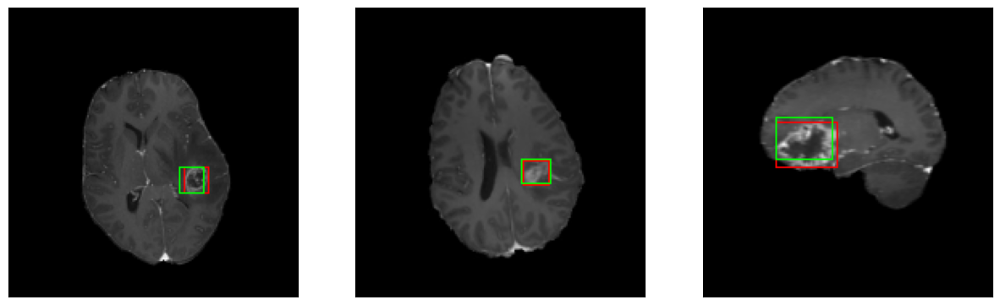

50/50 [==============================] - 8s 152ms/step - loss: 2.5081 - IoU: 0.5806 - val_loss: 2.9868 - val_IoU: 0.6336
Epoch 113/150
7/7 [==============================] - 0s 38ms/step


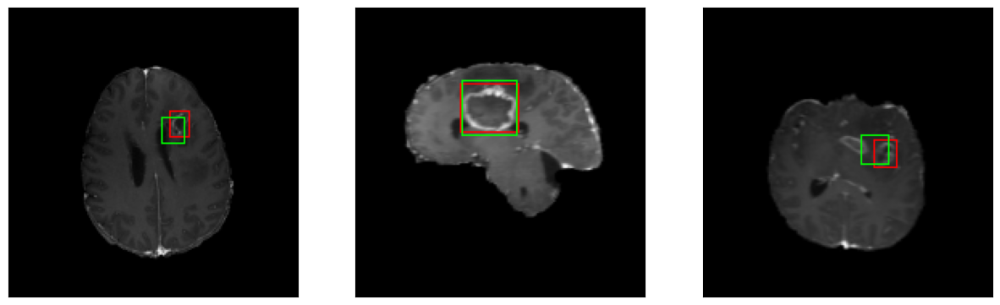

50/50 [==============================] - 7s 148ms/step - loss: 2.3918 - IoU: 0.5845 - val_loss: 3.0254 - val_IoU: 0.6378
Epoch 114/150
7/7 [==============================] - 0s 38ms/step


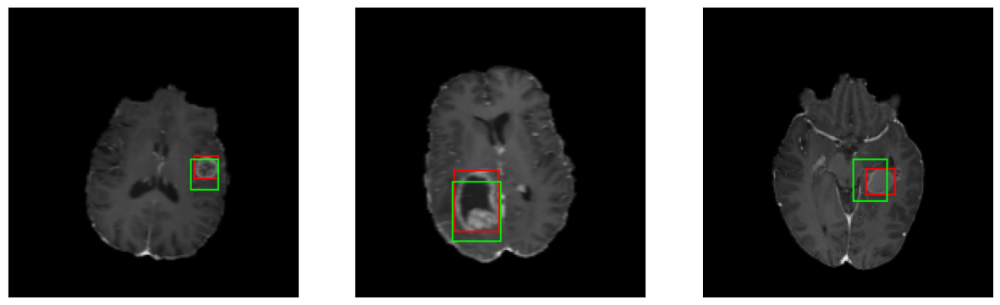

50/50 [==============================] - 7s 144ms/step - loss: 2.5338 - IoU: 0.5660 - val_loss: 3.2470 - val_IoU: 0.6304
Epoch 115/150
7/7 [==============================] - 0s 38ms/step


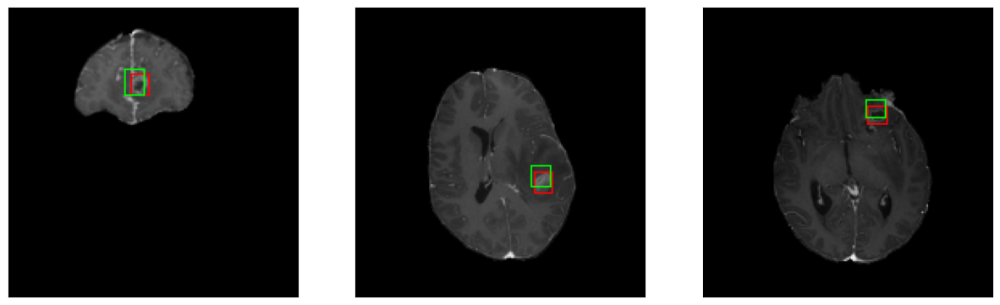

50/50 [==============================] - 8s 155ms/step - loss: 2.5181 - IoU: 0.5703 - val_loss: 2.9336 - val_IoU: 0.5907
Epoch 116/150
7/7 [==============================] - 0s 40ms/step


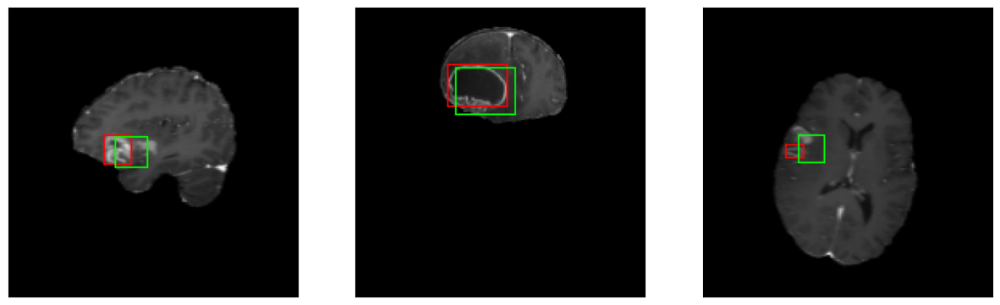

50/50 [==============================] - 7s 149ms/step - loss: 2.4830 - IoU: 0.5707 - val_loss: 3.7353 - val_IoU: 0.5017
Epoch 117/150
7/7 [==============================] - 0s 38ms/step


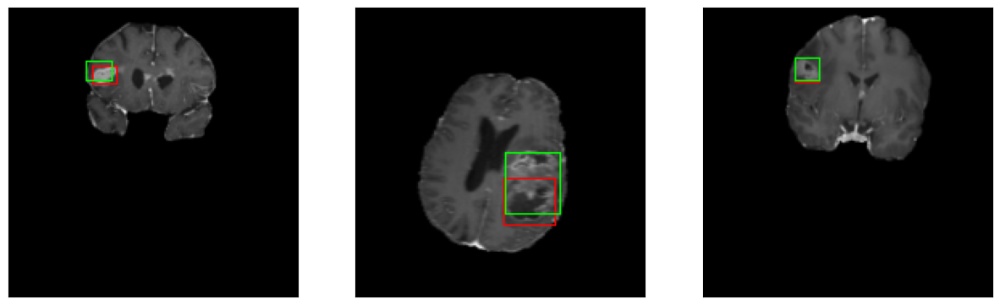

50/50 [==============================] - 8s 157ms/step - loss: 2.2966 - IoU: 0.5905 - val_loss: 3.3318 - val_IoU: 0.5886
Epoch 118/150
7/7 [==============================] - 0s 41ms/step


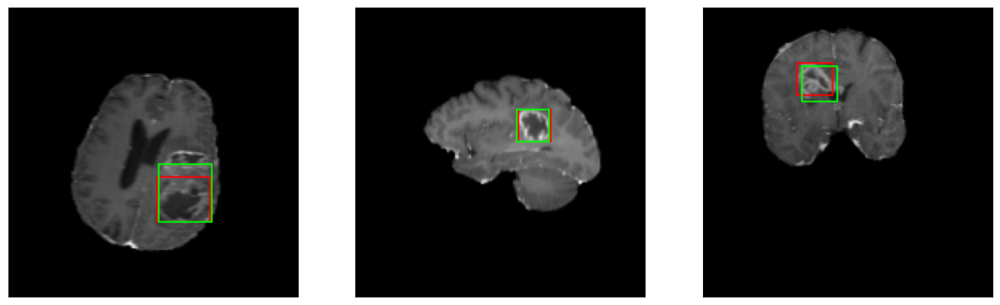

50/50 [==============================] - 8s 151ms/step - loss: 2.5401 - IoU: 0.5670 - val_loss: 3.1234 - val_IoU: 0.6178
Epoch 119/150
7/7 [==============================] - 0s 38ms/step


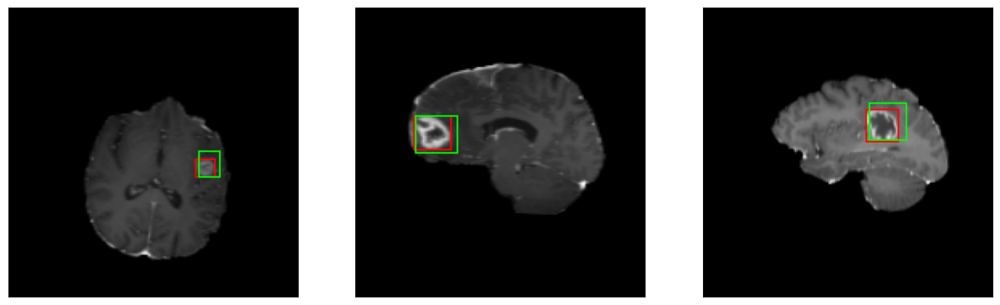

50/50 [==============================] - 7s 145ms/step - loss: 2.4950 - IoU: 0.5662 - val_loss: 4.2128 - val_IoU: 0.5249
Epoch 120/150
7/7 [==============================] - 0s 38ms/step


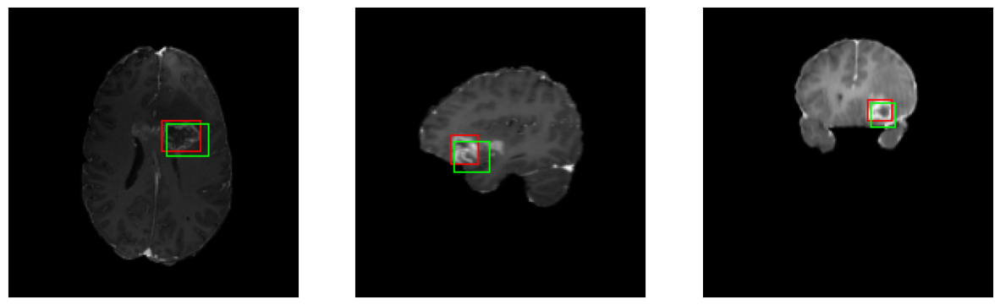

50/50 [==============================] - 8s 159ms/step - loss: 2.3887 - IoU: 0.5827 - val_loss: 3.7706 - val_IoU: 0.5157
Epoch 121/150
7/7 [==============================] - 0s 39ms/step


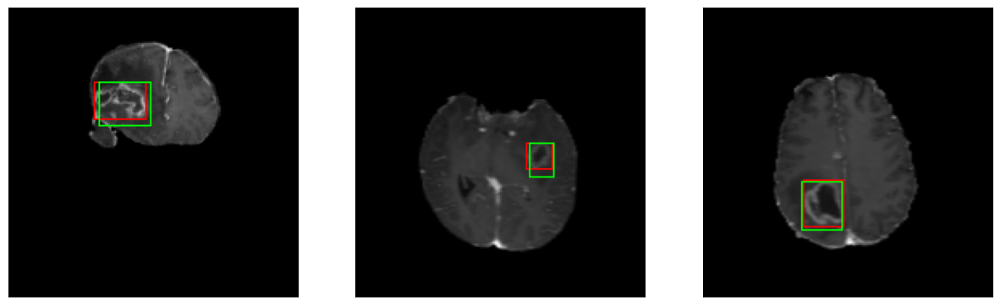

50/50 [==============================] - 7s 140ms/step - loss: 2.4347 - IoU: 0.5737 - val_loss: 3.4214 - val_IoU: 0.6100
Epoch 122/150
7/7 [==============================] - 0s 40ms/step


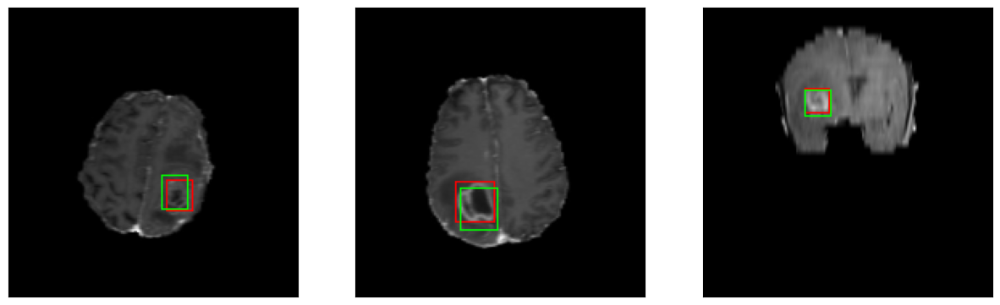

50/50 [==============================] - 8s 161ms/step - loss: 2.3860 - IoU: 0.5829 - val_loss: 2.7345 - val_IoU: 0.6537
Epoch 123/150
7/7 [==============================] - 0s 38ms/step


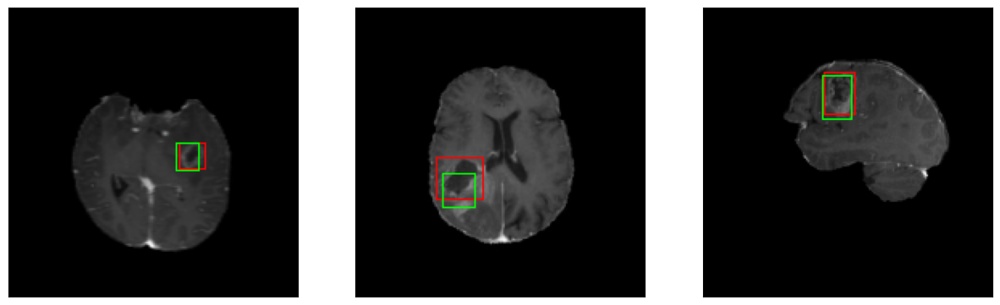

50/50 [==============================] - 8s 154ms/step - loss: 2.4091 - IoU: 0.5846 - val_loss: 3.0131 - val_IoU: 0.6340
Epoch 124/150
7/7 [==============================] - 0s 37ms/step


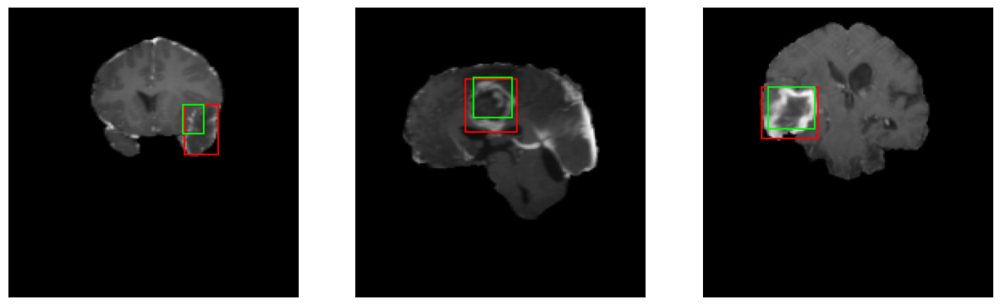

50/50 [==============================] - 8s 160ms/step - loss: 2.4453 - IoU: 0.5854 - val_loss: 3.2779 - val_IoU: 0.5924
Epoch 125/150
7/7 [==============================] - 0s 39ms/step


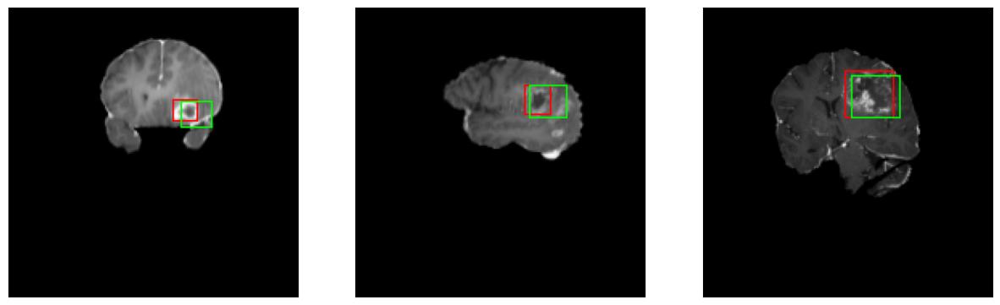

50/50 [==============================] - 7s 144ms/step - loss: 2.4526 - IoU: 0.5662 - val_loss: 3.0025 - val_IoU: 0.6291
Epoch 126/150
7/7 [==============================] - 0s 38ms/step


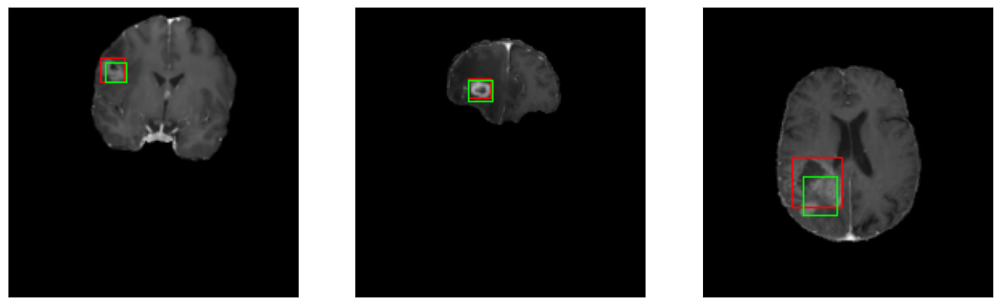

50/50 [==============================] - 8s 154ms/step - loss: 2.3703 - IoU: 0.5829 - val_loss: 2.9503 - val_IoU: 0.6583
Epoch 127/150
7/7 [==============================] - 0s 39ms/step


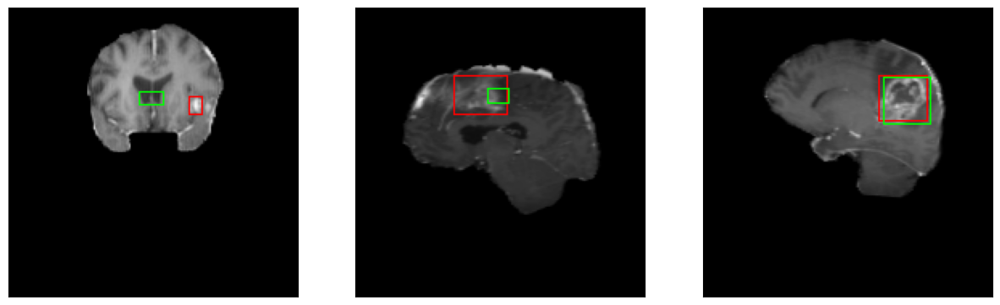

50/50 [==============================] - 7s 147ms/step - loss: 2.5236 - IoU: 0.5591 - val_loss: 3.0391 - val_IoU: 0.6194
Epoch 128/150
7/7 [==============================] - 0s 38ms/step


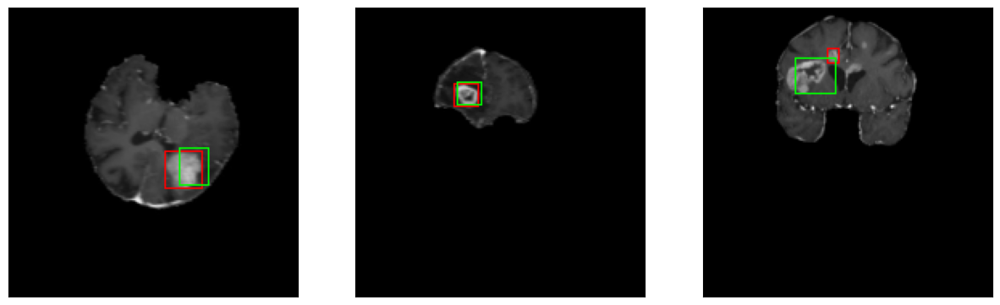

50/50 [==============================] - 8s 155ms/step - loss: 2.3188 - IoU: 0.5912 - val_loss: 3.6329 - val_IoU: 0.5338
Epoch 129/150
7/7 [==============================] - 0s 41ms/step


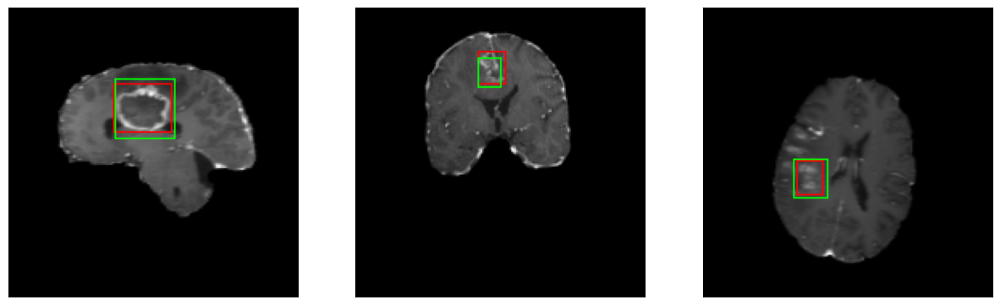

50/50 [==============================] - 8s 151ms/step - loss: 2.4417 - IoU: 0.5751 - val_loss: 4.5211 - val_IoU: 0.5220
Epoch 130/150
7/7 [==============================] - 0s 38ms/step


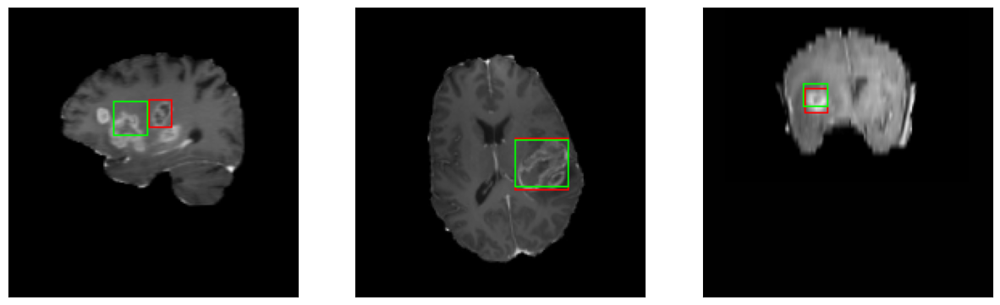

50/50 [==============================] - 8s 155ms/step - loss: 2.3942 - IoU: 0.5764 - val_loss: 2.9464 - val_IoU: 0.5982
Epoch 131/150
7/7 [==============================] - 0s 41ms/step


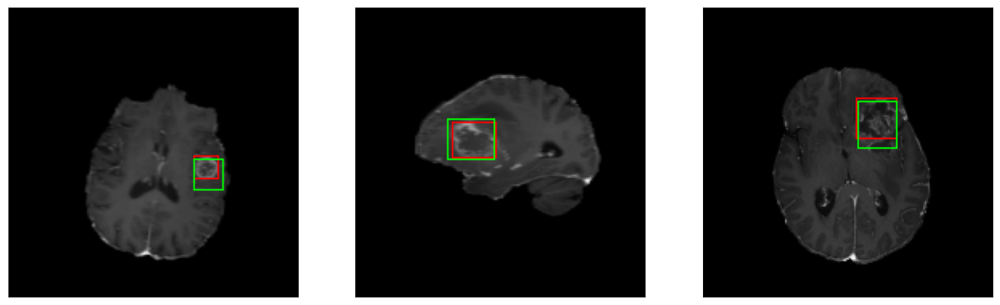

50/50 [==============================] - 8s 154ms/step - loss: 2.3293 - IoU: 0.5904 - val_loss: 3.1319 - val_IoU: 0.6312
Epoch 132/150
7/7 [==============================] - 0s 38ms/step


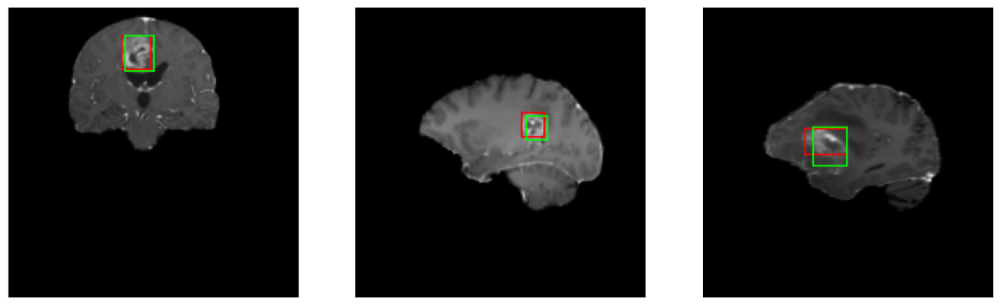

50/50 [==============================] - 8s 152ms/step - loss: 2.4255 - IoU: 0.5705 - val_loss: 3.2178 - val_IoU: 0.5981
Epoch 133/150
7/7 [==============================] - 0s 41ms/step


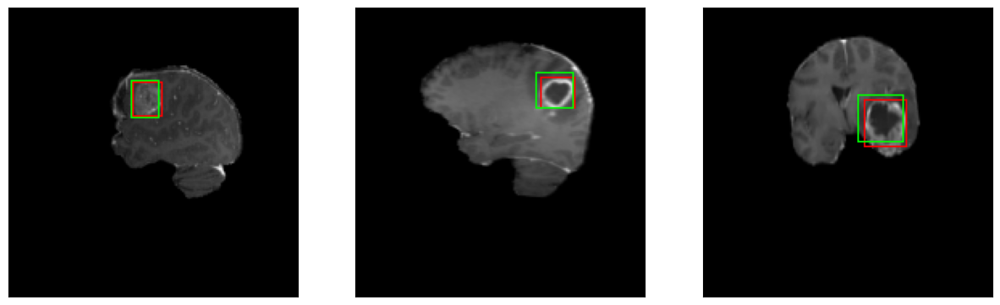

50/50 [==============================] - 8s 157ms/step - loss: 2.3918 - IoU: 0.5803 - val_loss: 2.8272 - val_IoU: 0.6579
Epoch 134/150
7/7 [==============================] - 0s 39ms/step


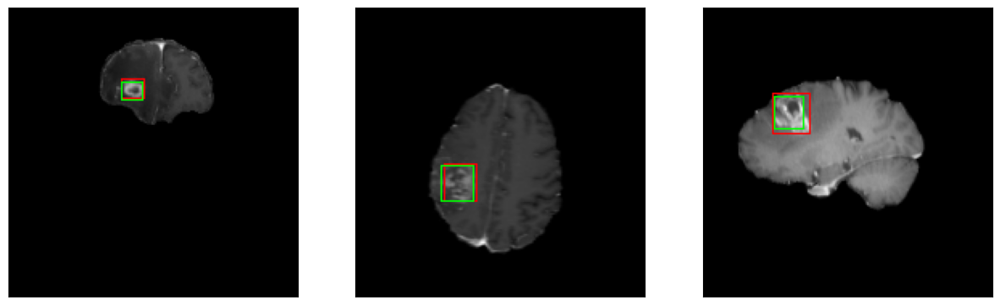

50/50 [==============================] - 7s 143ms/step - loss: 2.2786 - IoU: 0.5915 - val_loss: 3.1907 - val_IoU: 0.6387
Epoch 135/150
7/7 [==============================] - 0s 39ms/step


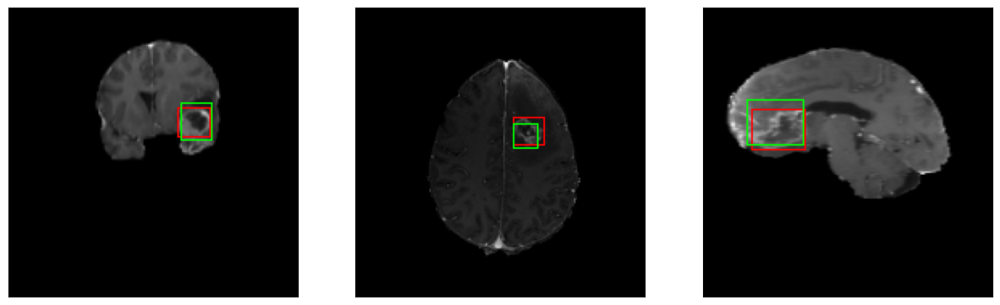

50/50 [==============================] - 7s 149ms/step - loss: 2.3942 - IoU: 0.5777 - val_loss: 2.9808 - val_IoU: 0.6402
Epoch 136/150
7/7 [==============================] - 0s 38ms/step


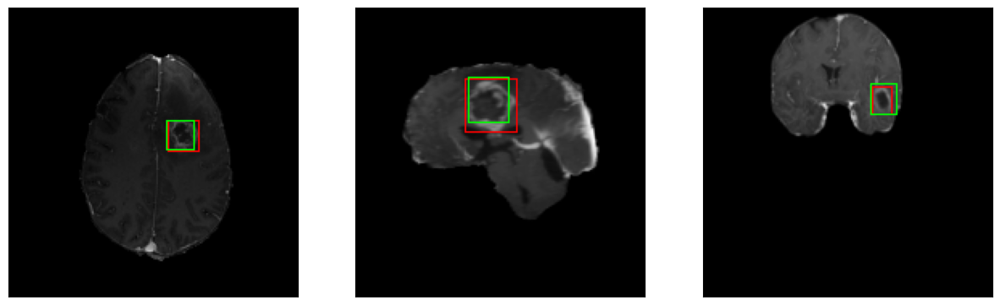

50/50 [==============================] - 7s 143ms/step - loss: 2.4282 - IoU: 0.5771 - val_loss: 2.9141 - val_IoU: 0.6288
Epoch 137/150
7/7 [==============================] - 0s 39ms/step


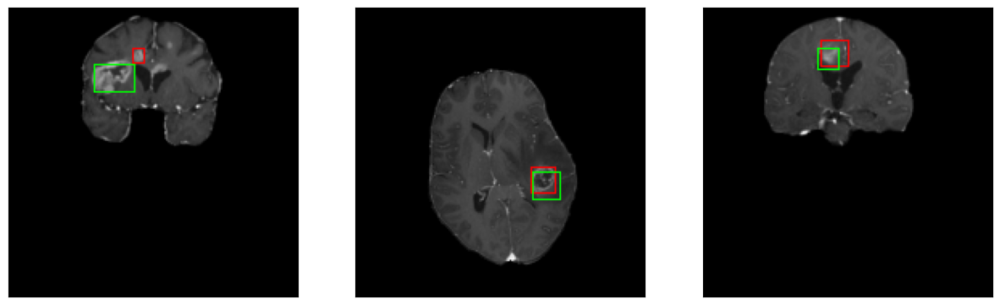

50/50 [==============================] - 8s 153ms/step - loss: 2.3054 - IoU: 0.5851 - val_loss: 2.8351 - val_IoU: 0.6467
Epoch 138/150
7/7 [==============================] - 0s 41ms/step


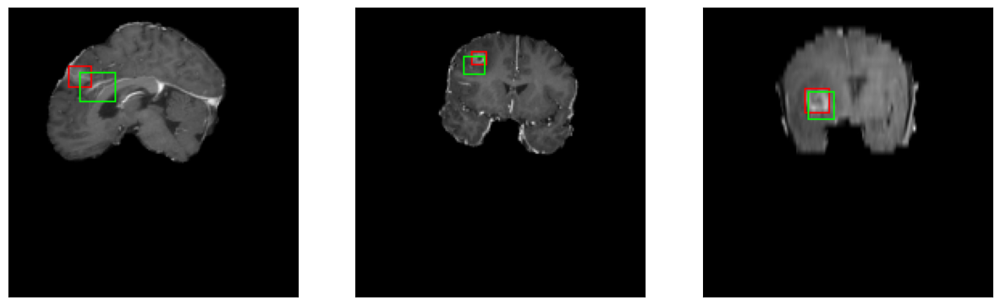

50/50 [==============================] - 7s 149ms/step - loss: 2.3882 - IoU: 0.5829 - val_loss: 3.2534 - val_IoU: 0.6210
Epoch 139/150
7/7 [==============================] - 0s 38ms/step


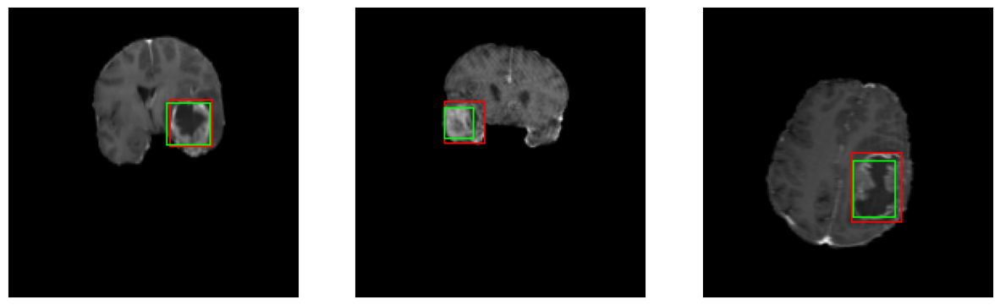

50/50 [==============================] - 8s 157ms/step - loss: 2.3843 - IoU: 0.5833 - val_loss: 3.0073 - val_IoU: 0.6202
Epoch 140/150
7/7 [==============================] - 0s 41ms/step


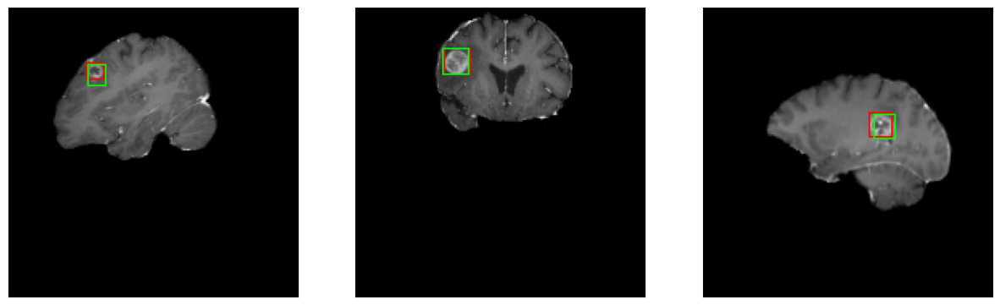

50/50 [==============================] - 8s 155ms/step - loss: 2.3297 - IoU: 0.5931 - val_loss: 2.6296 - val_IoU: 0.6730
Epoch 141/150
7/7 [==============================] - 0s 39ms/step


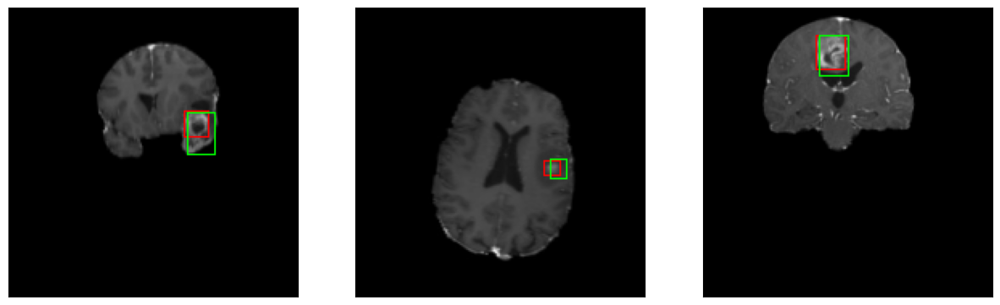

50/50 [==============================] - 7s 146ms/step - loss: 2.3430 - IoU: 0.5839 - val_loss: 3.5533 - val_IoU: 0.6073
Epoch 142/150
7/7 [==============================] - 0s 38ms/step


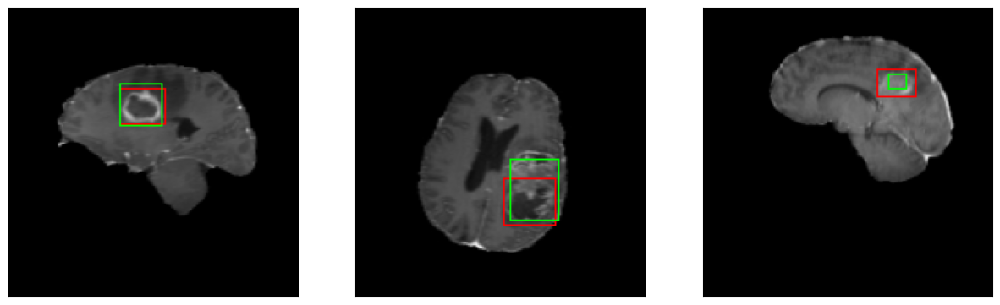

50/50 [==============================] - 8s 154ms/step - loss: 2.2786 - IoU: 0.5873 - val_loss: 2.8379 - val_IoU: 0.6712
Epoch 143/150
7/7 [==============================] - 0s 38ms/step


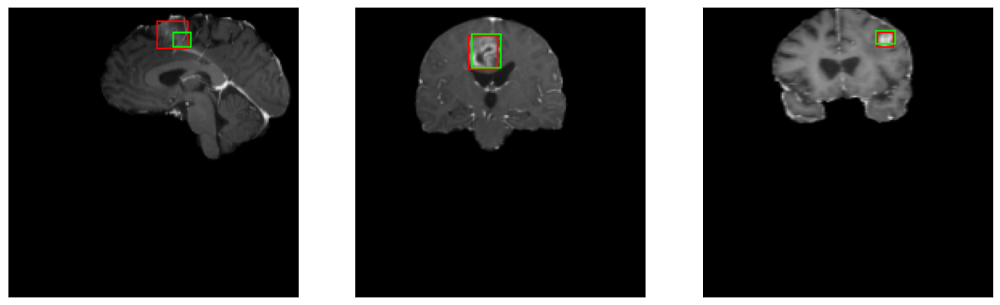

50/50 [==============================] - 7s 146ms/step - loss: 2.2661 - IoU: 0.5927 - val_loss: 2.9611 - val_IoU: 0.6497
Epoch 144/150
7/7 [==============================] - 0s 38ms/step


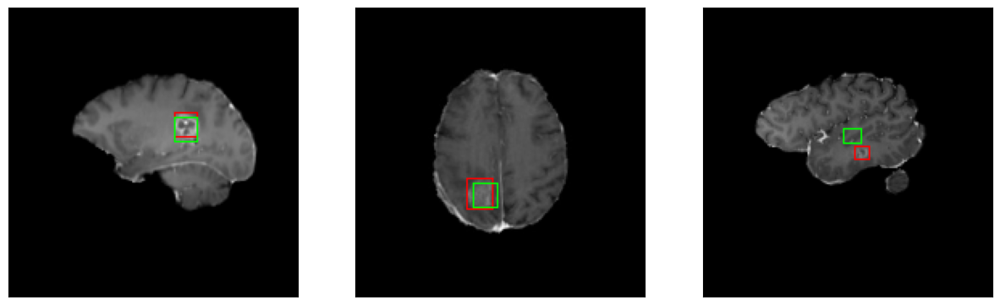

50/50 [==============================] - 8s 160ms/step - loss: 2.3897 - IoU: 0.5717 - val_loss: 2.7869 - val_IoU: 0.6707
Epoch 145/150
7/7 [==============================] - 0s 43ms/step


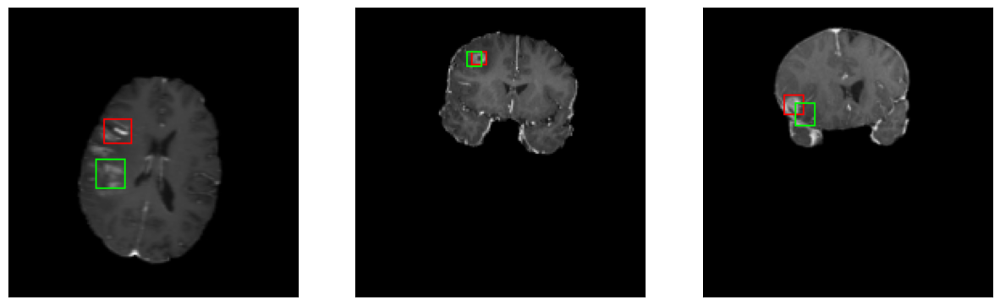

50/50 [==============================] - 8s 151ms/step - loss: 2.2217 - IoU: 0.5907 - val_loss: 2.9496 - val_IoU: 0.6444
Epoch 146/150
7/7 [==============================] - 0s 40ms/step


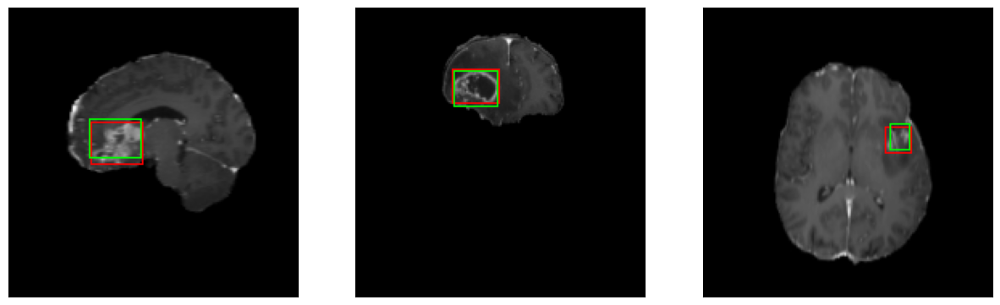

50/50 [==============================] - 8s 156ms/step - loss: 2.2681 - IoU: 0.5881 - val_loss: 2.7246 - val_IoU: 0.6606
Epoch 147/150
7/7 [==============================] - 0s 42ms/step


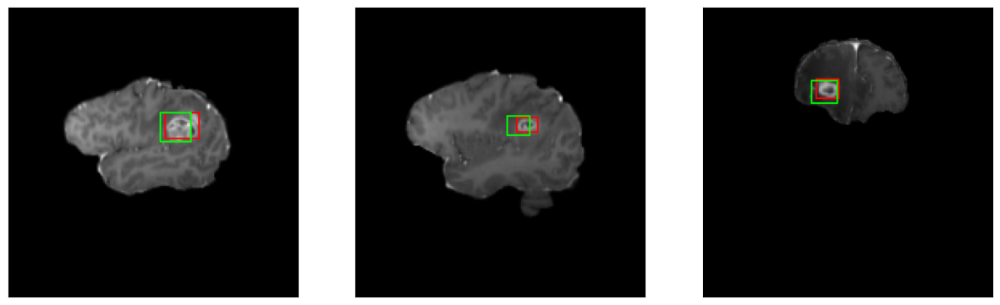

50/50 [==============================] - 8s 154ms/step - loss: 2.1699 - IoU: 0.6007 - val_loss: 2.7962 - val_IoU: 0.6778
Epoch 148/150
7/7 [==============================] - 0s 38ms/step


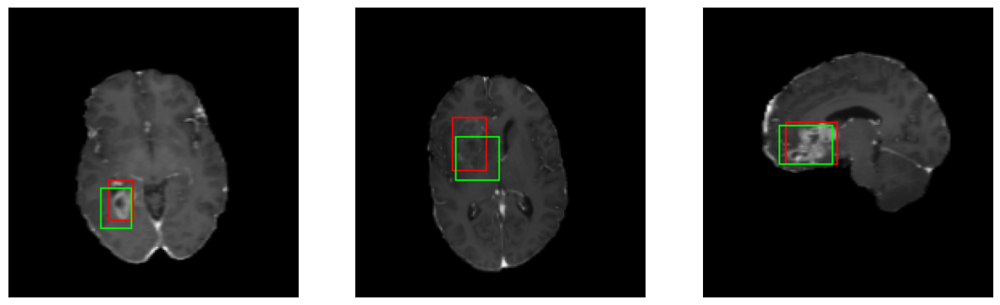

50/50 [==============================] - 8s 151ms/step - loss: 2.2694 - IoU: 0.5870 - val_loss: 2.9520 - val_IoU: 0.6390
Epoch 149/150
7/7 [==============================] - 0s 40ms/step


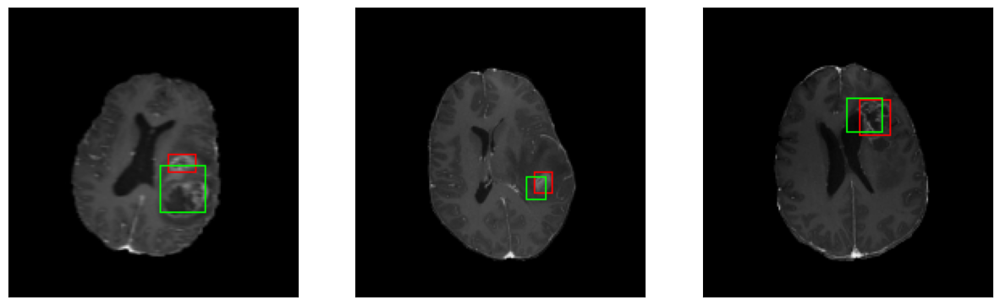

50/50 [==============================] - 8s 156ms/step - loss: 2.3418 - IoU: 0.5872 - val_loss: 3.0460 - val_IoU: 0.6223
Epoch 150/150
7/7 [==============================] - 0s 38ms/step


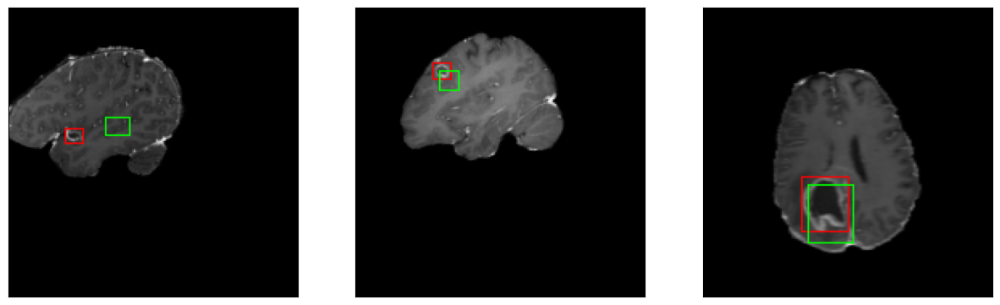

50/50 [==============================] - 7s 147ms/step - loss: 2.3168 - IoU: 0.5883 - val_loss: 4.3596 - val_IoU: 0.4690


In [34]:
model.fit(
        train_dataset,
        epochs=150,
        validation_data = val_dataset,
        callbacks = callbacks_list
        )

In [42]:
model.evaluate(test_dataset)
model.evaluate(train_dataset)
model.evaluate(val_dataset)

6/6 [==============================] - 1s 60ms/step - loss: 4.3596 - IoU: 0.4631


[4.359586715698242, 0.4630531370639801]